In [1]:
!pip install 'zarr<3'
!pip install timm


Defaulting to user installation because normal site-packages is not writeable
  Using cached zarr-2.18.7-py3-none-any.whl.metadata (5.8 kB)
  Using cached asciitree-0.3.3-py3-none-any.whl
  Using cached fasteners-0.20-py3-none-any.whl.metadata (4.8 kB)
  Using cached numcodecs-0.15.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.9 kB)
  Using cached deprecated-1.3.1-py2.py3-none-any.whl.metadata (5.9 kB)
Using cached zarr-2.18.7-py3-none-any.whl (211 kB)
Using cached numcodecs-0.15.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (8.9 MB)
Using cached fasteners-0.20-py3-none-any.whl (18 kB)
Using cached deprecated-1.3.1-py2.py3-none-any.whl (11 kB)

[notice] A new release of pip is available: 23.3.1 -> 25.3
[notice] To update, run: pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable
  Using cached timm-1.0.22-py3-none-any.whl.metadata (63 kB)
Using cached timm-1.0.22-py3-none-any.whl (2.5 MB)

[not

In [1]:
# ALWAYS RUN THIS FIRST!
import os
import sys
from pathlib import Path

NOTEBOOK_DIR = Path("/rsrch9/home/plm/idso_fa1_pathology/codes/yshokrollahi/vitamin-p-new")
os.chdir(NOTEBOOK_DIR)
sys.path.insert(0, str(NOTEBOOK_DIR))

print(f"✅ Working directory: {os.getcwd()}")

✅ Working directory: /rsrch9/home/plm/idso_fa1_pathology/codes/yshokrollahi/vitamin-p-new


## Data Loading

In [2]:
# Cell 3: Import and create dataloaders
from crc_dataset import Config, create_dataloaders

config = Config("config.yaml")
config.print_config()

train_loader, val_loader, test_loader = create_dataloaders(config)

print("\n✅ Ready to use!")

✅ CRC Dataset Package v1.0.0 loaded
CRC DATASET CONFIGURATION
Config File: config.yaml
Zarr Base: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC/zarr_data
Cache: ./cache/crc_dataset_cache.pkl
Strategy: memory

📊 Data Splits:
  Train: 28 samples
  Val: 6 samples
  Test: 7 samples

🔄 DataLoader:
  Batch Size: 4
  Num Workers: 0
  Pin Memory: True

🎨 Augmentation:
  Training: True
  Probability: 0.0

🎯 HV Maps:
  Generate: True
  Method: pannuke
  HE Nuclei: True
  HE Cells: True
  MIF Nuclei: True
  MIF Cells: True

🔍 Filtering:
  Min Instances: 0
  Filter Empty: True

CREATING DATALOADERS
Strategy: memory
Use Cache: True
Batch Size: 4
Num Workers: 0

📦 Loading from cache: ./cache/crc_cache_train_82d4f49c.pkl
📦 Loaded 1987 patches from cache
📦 Loading from cache: ./cache/crc_cache_val_79e4cd4c.pkl
📦 Loaded 944 patches from cache
📦 Loading from cache: ./cache/crc_cache_val_81ebba58.pkl
📦 Loaded 406 patches from cache
✅ Dataloaders created:
   Train: 1987 patches (496 b

## defiusions

In [11]:
# ============================================================================
# PIX2PIX: H&E → SYNTHETIC MIF GENERATOR
# Complete training pipeline in one cell
# ============================================================================

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm
import wandb
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ============================================================================
# PIX2PIX ARCHITECTURE
# ============================================================================

class UNetDown(nn.Module):
    def __init__(self, in_size, out_size, normalize=True, dropout=0.0):
        super(UNetDown, self).__init__()
        layers = [nn.Conv2d(in_size, out_size, 4, 2, 1, bias=False)]
        if normalize:
            layers.append(nn.BatchNorm2d(out_size))
        layers.append(nn.LeakyReLU(0.2))
        if dropout:
            layers.append(nn.Dropout(dropout))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

class UNetUp(nn.Module):
    def __init__(self, in_size, out_size, dropout=0.0):
        super(UNetUp, self).__init__()
        layers = [
            nn.ConvTranspose2d(in_size, out_size, 4, 2, 1, bias=False),
            nn.BatchNorm2d(out_size),
            nn.ReLU(inplace=True),
        ]
        if dropout:
            layers.append(nn.Dropout(dropout))
        self.model = nn.Sequential(*layers)

    def forward(self, x, skip_input):
        x = self.model(x)
        x = torch.cat((x, skip_input), 1)
        return x

class GeneratorUNet(nn.Module):
    """Pix2Pix Generator: H&E (3ch) → MIF (2ch)"""
    def __init__(self, in_channels=3, out_channels=2):
        super(GeneratorUNet, self).__init__()

        # Encoder (downsampling)
        self.down1 = UNetDown(in_channels, 64, normalize=False)  # 512 → 256
        self.down2 = UNetDown(64, 128)                            # 256 → 128
        self.down3 = UNetDown(128, 256)                           # 128 → 64
        self.down4 = UNetDown(256, 512, dropout=0.5)              # 64 → 32
        self.down5 = UNetDown(512, 512, dropout=0.5)              # 32 → 16
        self.down6 = UNetDown(512, 512, dropout=0.5)              # 16 → 8
        self.down7 = UNetDown(512, 512, dropout=0.5)              # 8 → 4
        self.down8 = UNetDown(512, 512, normalize=False, dropout=0.5)  # 4 → 2

        # Decoder (upsampling)
        self.up1 = UNetUp(512, 512, dropout=0.5)                  # 2 → 4
        self.up2 = UNetUp(1024, 512, dropout=0.5)                 # 4 → 8
        self.up3 = UNetUp(1024, 512, dropout=0.5)                 # 8 → 16
        self.up4 = UNetUp(1024, 512, dropout=0.5)                 # 16 → 32
        self.up5 = UNetUp(1024, 256)                              # 32 → 64
        self.up6 = UNetUp(512, 128)                               # 64 → 128
        self.up7 = UNetUp(256, 64)                                # 128 → 256

        # Final layer
        self.final = nn.Sequential(
            nn.Upsample(scale_factor=2),                          # 256 → 512
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(128, out_channels, 4, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        # Encoder with skip connections
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)
        
        # Decoder with skip connections
        u1 = self.up1(d8, d7)
        u2 = self.up2(u1, d6)
        u3 = self.up3(u2, d5)
        u4 = self.up4(u3, d4)
        u5 = self.up5(u4, d3)
        u6 = self.up6(u5, d2)
        u7 = self.up7(u6, d1)
        
        return self.final(u7)

class Discriminator(nn.Module):
    """PatchGAN Discriminator"""
    def __init__(self, in_channels=5):  # 3 (H&E) + 2 (MIF) = 5
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, normalization=True):
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalization:
                layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(in_channels, 64, normalization=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1, bias=False)
        )

    def forward(self, img_A, img_B):
        # Concatenate H&E and MIF
        img_input = torch.cat((img_A, img_B), 1)
        return self.model(img_input)

# ============================================================================
# LOSSES
# ============================================================================

class GANLoss(nn.Module):
    def __init__(self):
        super(GANLoss, self).__init__()
        self.loss = nn.BCEWithLogitsLoss()
    
    def forward(self, prediction, target_is_real):
        if target_is_real:
            target = torch.ones_like(prediction)
        else:
            target = torch.zeros_like(prediction)
        return self.loss(prediction, target)

# ============================================================================
# PREPROCESSING
# ============================================================================

class SimplePreprocessing:
    def percentile_normalize(self, img):
        if img.dim() == 4:
            B = img.shape[0]
            normalized = []
            for i in range(B):
                single_img = img[i]
                p1 = torch.quantile(single_img, 0.01)
                p99 = torch.quantile(single_img, 0.99)
                norm_img = (single_img - p1) / (p99 - p1 + 1e-8)
                normalized.append(torch.clamp(norm_img, 0, 1))
            return torch.stack(normalized, dim=0)
        else:
            p1 = torch.quantile(img, 0.01)
            p99 = torch.quantile(img, 0.99)
            img = (img - p1) / (p99 - p1 + 1e-8)
            return torch.clamp(img, 0, 1)

# ============================================================================
# TRAINING FUNCTION
# ============================================================================

def train_pix2pix(train_loader, val_loader, epochs=100, device='cuda', 
                  lambda_l1=100, use_wandb=True):
    """
    Train Pix2Pix: H&E → Synthetic MIF
    
    Args:
        train_loader: DataLoader with H&E + MIF pairs
        val_loader: Validation DataLoader
        epochs: Number of training epochs
        device: 'cuda' or 'cpu'
        lambda_l1: Weight for L1 loss (default: 100)
        use_wandb: Log to Weights & Biases
    """
    
    # Initialize models
    generator = GeneratorUNet(in_channels=3, out_channels=2).to(device)
    discriminator = Discriminator(in_channels=5).to(device)
    
    # Optimizers
    optimizer_G = Adam(generator.parameters(), lr=2e-4, betas=(0.5, 0.999))
    optimizer_D = Adam(discriminator.parameters(), lr=2e-4, betas=(0.5, 0.999))
    
    # Schedulers
    scheduler_G = ReduceLROnPlateau(optimizer_G, mode='min', factor=0.5, patience=10, verbose=True)
    scheduler_D = ReduceLROnPlateau(optimizer_D, mode='min', factor=0.5, patience=10, verbose=True)
    
    # Loss functions
    criterion_GAN = GANLoss().to(device)
    criterion_L1 = nn.L1Loss().to(device)
    
    # Preprocessing
    preprocessor = SimplePreprocessing()
    
    # W&B
    if use_wandb:
        wandb.init(
            project="vitamin-p-pix2pix",
            name="HE_to_MIF_Generator",
            config={
                "model": "Pix2Pix",
                "epochs": epochs,
                "lr": 2e-4,
                "lambda_l1": lambda_l1,
                "batch_size": train_loader.batch_size,
            }
        )
    
    best_val_loss = float('inf')
    
    print("=" * 80)
    print(f"{'PIX2PIX TRAINING: H&E → SYNTHETIC MIF':^80}")
    print("=" * 80)
    print(f"Generator params: {sum(p.numel() for p in generator.parameters()):,}")
    print(f"Discriminator params: {sum(p.numel() for p in discriminator.parameters()):,}")
    print(f"Device: {device}")
    print(f"Epochs: {epochs} | LR: 2e-4 | Lambda L1: {lambda_l1}")
    print("=" * 80)
    
    for epoch in range(epochs):
        generator.train()
        discriminator.train()
        
        # Training metrics
        train_g_loss = 0
        train_d_loss = 0
        train_l1_loss = 0
        
        pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{epochs}', ncols=120)
        
        for batch in pbar:
            he_img = batch['he_image'].to(device)
            mif_img = batch['mif_image'].to(device)
            
            # Normalize
            he_img = preprocessor.percentile_normalize(he_img)
            mif_img = preprocessor.percentile_normalize(mif_img)
            
            # Scale to [-1, 1] for GAN
            he_img = he_img * 2 - 1
            mif_img = mif_img * 2 - 1
            
            batch_size = he_img.size(0)
            
            # ============================================================
            # Train Generator
            # ============================================================
            optimizer_G.zero_grad()
            
            # Generate fake MIF
            fake_mif = generator(he_img)
            
            # GAN loss (fool discriminator)
            pred_fake = discriminator(he_img, fake_mif)
            loss_GAN = criterion_GAN(pred_fake, True)
            
            # L1 loss (pixel-wise similarity)
            loss_L1 = criterion_L1(fake_mif, mif_img)
            
            # Total generator loss
            loss_G = loss_GAN + lambda_l1 * loss_L1
            
            loss_G.backward()
            optimizer_G.step()
            
            # ============================================================
            # Train Discriminator
            # ============================================================
            optimizer_D.zero_grad()
            
            # Real loss
            pred_real = discriminator(he_img, mif_img)
            loss_D_real = criterion_GAN(pred_real, True)
            
            # Fake loss
            fake_mif_detached = fake_mif.detach()
            pred_fake = discriminator(he_img, fake_mif_detached)
            loss_D_fake = criterion_GAN(pred_fake, False)
            
            # Total discriminator loss
            loss_D = (loss_D_real + loss_D_fake) * 0.5
            
            loss_D.backward()
            optimizer_D.step()
            
            # Accumulate metrics
            train_g_loss += loss_G.item()
            train_d_loss += loss_D.item()
            train_l1_loss += loss_L1.item()
            
            pbar.set_postfix({
                'G_loss': f'{loss_G.item():.4f}',
                'D_loss': f'{loss_D.item():.4f}',
                'L1': f'{loss_L1.item():.4f}'
            })
            
            if use_wandb:
                wandb.log({
                    "batch/g_loss": loss_G.item(),
                    "batch/d_loss": loss_D.item(),
                    "batch/l1_loss": loss_L1.item(),
                })
        
        # Average training metrics
        n_batches = len(train_loader)
        train_g_loss /= n_batches
        train_d_loss /= n_batches
        train_l1_loss /= n_batches
        
        # ============================================================
        # Validation
        # ============================================================
        generator.eval()
        val_l1_loss = 0
        
        with torch.no_grad():
            for batch in val_loader:
                he_img = batch['he_image'].to(device)
                mif_img = batch['mif_image'].to(device)
                
                he_img = preprocessor.percentile_normalize(he_img)
                mif_img = preprocessor.percentile_normalize(mif_img)
                
                he_img = he_img * 2 - 1
                mif_img = mif_img * 2 - 1
                
                fake_mif = generator(he_img)
                loss_L1 = criterion_L1(fake_mif, mif_img)
                
                val_l1_loss += loss_L1.item()
        
        val_l1_loss /= len(val_loader)
        
        # Logging
        print(f"\nEpoch {epoch+1}/{epochs}")
        print(f"Train - G Loss: {train_g_loss:.4f} | D Loss: {train_d_loss:.4f} | L1: {train_l1_loss:.4f}")
        print(f"Val   - L1: {val_l1_loss:.4f}")
        
        if use_wandb:
            wandb.log({
                "epoch": epoch + 1,
                "train/g_loss": train_g_loss,
                "train/d_loss": train_d_loss,
                "train/l1_loss": train_l1_loss,
                "val/l1_loss": val_l1_loss,
                "lr": optimizer_G.param_groups[0]['lr']
            })
        
        scheduler_G.step(val_l1_loss)
        scheduler_D.step(val_l1_loss)
        
        # Save best model
        if val_l1_loss < best_val_loss:
            best_val_loss = val_l1_loss
            torch.save({
                'epoch': epoch,
                'generator_state_dict': generator.state_dict(),
                'discriminator_state_dict': discriminator.state_dict(),
                'optimizer_G_state_dict': optimizer_G.state_dict(),
                'optimizer_D_state_dict': optimizer_D.state_dict(),
                'val_l1_loss': val_l1_loss,
            }, 'pix2pix_he_to_mif_best.pth')
            print(f'✅ Best model saved! Val L1: {val_l1_loss:.4f}\n')
    
    print("\n" + "=" * 80)
    print(f"{'TRAINING COMPLETE':^80}")
    print(f"Best Val L1 Loss: {best_val_loss:.4f}")
    print("=" * 80)
    
    if use_wandb:
        wandb.finish()
    
    return generator, discriminator

# ============================================================================
# MAIN - READY TO TRAIN
# ============================================================================

if __name__ == "__main__":
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    print("\n" + "=" * 80)
    print(f"{'PIX2PIX: H&E → SYNTHETIC MIF GENERATOR':^80}")
    print("=" * 80)
    print(f"Device: {device}")
    print(f"Ready to train!")
    print("=" * 80)
    
    # Train the generator
    if 'train_loader' in locals() and 'val_loader' in locals():
        generator, discriminator = train_pix2pix(
            train_loader=train_loader,
            val_loader=val_loader,
            epochs=100,
            device=device,
            lambda_l1=100,
            use_wandb=False
        )
        print("\n✅ Pix2Pix training complete!")
        print("Model saved as: pix2pix_he_to_mif_best.pth")
    else:
        print("⚠️  train_loader and val_loader not found!")
        print("Run this after loading your data with create_dataloaders()")


                     PIX2PIX: H&E → SYNTHETIC MIF GENERATOR                     
Device: cuda
Ready to train!
                     PIX2PIX TRAINING: H&E → SYNTHETIC MIF                      
Generator params: 54,411,906
Discriminator params: 2,768,576
Device: cuda
Epochs: 100 | LR: 2e-4 | Lambda L1: 100


Epoch 1/100:   3%|▋                          | 13/496 [00:03<01:56,  4.13it/s, G_loss=16.2351, D_loss=0.6916, L1=0.1555]


KeyboardInterrupt: 

✅ Generator loaded!


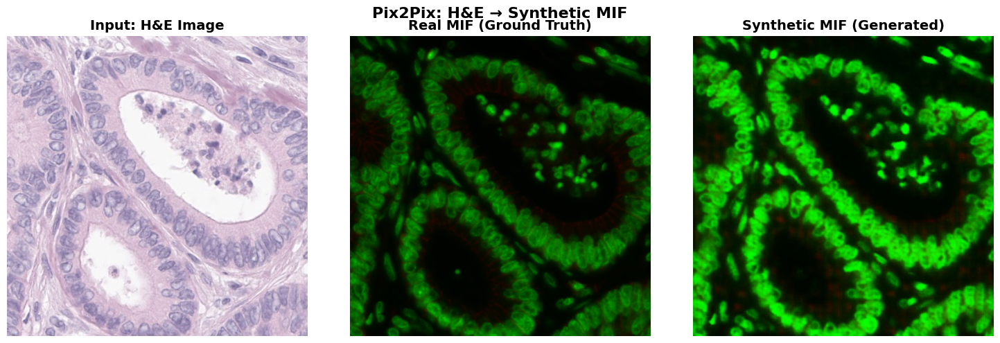


📊 L1 Error: 0.0889
💡 Lower is better (0 = perfect match)


In [10]:
# ============================================================================
# LOAD PIX2PIX AND VISUALIZE ONE SAMPLE
# ============================================================================

import torch
import matplotlib.pyplot as plt
import numpy as np

# Load trained generator
device = 'cuda' if torch.cuda.is_available() else 'cpu'
generator = GeneratorUNet(in_channels=3, out_channels=2).to(device)

checkpoint = torch.load('pix2pix_he_to_mif_best.pth', map_location=device)
generator.load_state_dict(checkpoint['generator_state_dict'])
generator.eval()

print("✅ Generator loaded!")

# Get one sample
val_iter = iter(val_loader)
batch = next(val_iter)

he_img = batch['he_image'][0].to(device)
mif_img = batch['mif_image'][0].to(device)

# Preprocess
preprocessor = SimplePreprocessing()
he_input = preprocessor.percentile_normalize(he_img.unsqueeze(0))
he_input = he_input * 2 - 1  # Scale to [-1, 1]

# Generate synthetic MIF
with torch.no_grad():
    synthetic_mif = generator(he_input)

# Convert back to [0, 1] and move to CPU
he_img_vis = he_img.cpu().permute(1, 2, 0).numpy()
mif_real_vis = mif_img.cpu().permute(1, 2, 0).numpy()
synthetic_mif_vis = ((synthetic_mif[0].cpu() + 1) / 2).permute(1, 2, 0).numpy()

# Clip to valid range
he_img_vis = np.clip(he_img_vis, 0, 1)
mif_real_vis = np.clip(mif_real_vis, 0, 1)
synthetic_mif_vis = np.clip(synthetic_mif_vis, 0, 1)

# Convert MIF to RGB for visualization (2ch → 3ch)
mif_real_rgb = np.zeros((512, 512, 3))
mif_real_rgb[:, :, 0] = mif_real_vis[:, :, 0]  # Red channel
mif_real_rgb[:, :, 1] = mif_real_vis[:, :, 1]  # Green channel

synthetic_mif_rgb = np.zeros((512, 512, 3))
synthetic_mif_rgb[:, :, 0] = synthetic_mif_vis[:, :, 0]  # Red channel
synthetic_mif_rgb[:, :, 1] = synthetic_mif_vis[:, :, 1]  # Green channel

# Visualize
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(he_img_vis)
axes[0].set_title('Input: H&E Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(mif_real_rgb)
axes[1].set_title('Real MIF (Ground Truth)', fontsize=14, fontweight='bold')
axes[1].axis('off')

axes[2].imshow(synthetic_mif_rgb)
axes[2].set_title('Synthetic MIF (Generated)', fontsize=14, fontweight='bold')
axes[2].axis('off')

plt.suptitle('Pix2Pix: H&E → Synthetic MIF', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Calculate L1 error
l1_error = np.abs(synthetic_mif_vis - mif_real_vis).mean()
print(f"\n📊 L1 Error: {l1_error:.4f}")
print(f"💡 Lower is better (0 = perfect match)")

## Vit backbone

In [14]:
# 1. Imports
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm
import wandb
import timm


# ============================================================================
# LOSSES
# ============================================================================

class DiceFocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2, smooth=1):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.smooth = smooth
    
    def forward(self, pred, target):
        pred_flat = pred.view(-1)
        target_flat = target.view(-1)
        
        intersection = (pred_flat * target_flat).sum()
        dice_loss = 1 - (2 * intersection + self.smooth) / (pred_flat.sum() + target_flat.sum() + self.smooth)
        
        ce_loss = F.binary_cross_entropy(pred, target, reduction='none')
        pt = torch.exp(-ce_loss)
        focal_loss = self.alpha * (1 - pt) ** self.gamma * ce_loss
        focal_loss = focal_loss.mean()
        
        return dice_loss + focal_loss

class MSGELossMaps(nn.Module):
    def __init__(self):
        super().__init__()
    
    def get_sobel_kernel(self, size: int, device: str):
        assert size % 2 == 1
        h_range = torch.arange(-size // 2 + 1, size // 2 + 1, dtype=torch.float32, device=device, requires_grad=False)
        v_range = torch.arange(-size // 2 + 1, size // 2 + 1, dtype=torch.float32, device=device, requires_grad=False)
        h, v = torch.meshgrid(h_range, v_range, indexing="ij")
        kernel_h = h / (h * h + v * v + 1.0e-15)
        kernel_v = v / (h * h + v * v + 1.0e-15)
        return kernel_h, kernel_v
    
    def get_gradient_hv(self, hv: torch.Tensor, device: str):
        kernel_h, kernel_v = self.get_sobel_kernel(5, device=device)
        kernel_h = kernel_h.view(1, 1, 5, 5)
        kernel_v = kernel_v.view(1, 1, 5, 5)
        
        h_ch = hv[..., 0].unsqueeze(1)
        v_ch = hv[..., 1].unsqueeze(1)
        
        h_dh_ch = F.conv2d(h_ch, kernel_h, padding=2)
        v_dv_ch = F.conv2d(v_ch, kernel_v, padding=2)
        
        dhv = torch.cat([h_dh_ch, v_dv_ch], dim=1)
        dhv = dhv.permute(0, 2, 3, 1).contiguous()
        return dhv
    
    def forward(self, input: torch.Tensor, target: torch.Tensor, focus: torch.Tensor, device: str):
        input = input.permute(0, 2, 3, 1)
        target = target.permute(0, 2, 3, 1)
        focus = focus.permute(0, 2, 3, 1)
        
        focus = focus[..., 0]
        focus = (focus[..., None]).float()
        focus = torch.cat([focus, focus], axis=-1).to(device)
        
        true_grad = self.get_gradient_hv(target, device)
        pred_grad = self.get_gradient_hv(input, device)
        
        loss = pred_grad - true_grad
        loss = focus * (loss * loss)
        loss = loss.sum() / (focus.sum() + 1.0e-8)
        
        return loss

class HVLoss(nn.Module):
    """Combined MSE + MSGE loss for HV maps (HoVer-Net style)"""
    def __init__(self):
        super().__init__()
        self.mse = nn.MSELoss()
        self.msge = MSGELossMaps()
    
    def forward(self, pred, target, focus, device):
        # MSE: Direct distance prediction error
        mse_loss = self.mse(pred, target)
        
        # MSGE: Gradient error (for cell separation)
        msge_loss = self.msge(pred, target, focus, device)
        
        # Combine both (equal weight as in HoVer-Net)
        return mse_loss + msge_loss
# ============================================================================
# DINOV2 BACKBONE (FIXED with TIMM for Python 3.8)
# ============================================================================

# ============================================================================
# DINOV2 BACKBONE (FIXED: Removed Double CLS Addition)
# ============================================================================

class DINOv2Backbone(nn.Module):
    def __init__(self, model_size='base'):
        super().__init__()
        
        model_configs = {
            'small': {'name': 'vit_small_patch14_dinov2.lvd142m', 'embed_dim': 384},
            'base':  {'name': 'vit_base_patch14_dinov2.lvd142m',  'embed_dim': 768},
            'large': {'name': 'vit_large_patch14_dinov2.lvd142m', 'embed_dim': 1024},
            'giant': {'name': 'vit_giant_patch14_dinov2.lvd142m', 'embed_dim': 1536}
        }
        
        config = model_configs[model_size]
        self.embed_dim = config['embed_dim']
        self.patch_size = 14
        
        self.dinov2 = timm.create_model(
            config['name'],
            pretrained=True,
            dynamic_img_size=True
        )
        
        self.num_layers = len(self.dinov2.blocks)
        self.feature_layers = [
            self.num_layers // 4,
            self.num_layers // 2,
            3 * self.num_layers // 4,
            self.num_layers - 1
        ]
    
    def forward(self, x):
        B = x.shape[0]
        
        # 1. Patch Embedding
        x = self.dinov2.patch_embed(x)
        
        # 2. Add Position Embedding 
        # (NOTE: In timm, this function AUTOMATICALLY adds the CLS token!)
        x = self.dinov2._pos_embed(x)
        
        # REMOVED: Manual CLS token addition to prevent shape mismatch
        
        features = {}
        
        # 3. Iterate blocks
        for i, blk in enumerate(self.dinov2.blocks):
            x = blk(x)
            
            if i in self.feature_layers:
                # Remove the CLS token (index 0)
                patch_tokens = x[:, 1:]
                
                # Calculate H, W dynamically (e.g. 1369 -> 37x37)
                h = w = int(patch_tokens.shape[1] ** 0.5)
                
                feat = patch_tokens.transpose(1, 2).reshape(B, self.embed_dim, h, w)
                features[f'layer_{i}'] = feat
        
        return features
# ============================================================================
# DINOV2 U-NET
# ============================================================================

class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.conv(x)

class DINOv2UNet(nn.Module):
    def __init__(self, n_classes=3, model_size='base', freeze_backbone=False):
        super().__init__()
        
        self.model_size = model_size
        self.backbone = DINOv2Backbone(model_size=model_size)
        embed_dim = self.backbone.embed_dim
        
        if freeze_backbone:
            for param in self.backbone.parameters():
                param.requires_grad = False
        
        # Decoder channel configuration
        if model_size == 'small':
            dec_dims = [384, 256, 128, 64]
        elif model_size == 'base':
            dec_dims = [768, 384, 192, 96]  # Match embed_dim=768
        elif model_size == 'large':
            dec_dims = [1024, 512, 256, 128]
        elif model_size == 'giant':
            dec_dims = [1536, 768, 384, 192]
        
        self.proj3 = nn.Conv2d(embed_dim, dec_dims[0], 1)
        self.proj2 = nn.Conv2d(embed_dim, dec_dims[1], 1)
        self.proj1 = nn.Conv2d(embed_dim, dec_dims[2], 1)
        self.proj0 = nn.Conv2d(embed_dim, dec_dims[3], 1)
        
        self.dec1 = ConvBlock(dec_dims[0] + dec_dims[0], dec_dims[0])
        self.dec2 = ConvBlock(dec_dims[0] + dec_dims[1], dec_dims[1])
        self.dec3 = ConvBlock(dec_dims[1] + dec_dims[2], dec_dims[2])
        self.dec4 = ConvBlock(dec_dims[2] + dec_dims[3], dec_dims[3])
        
        self.final_conv = ConvBlock(dec_dims[3], 32)
        
        self.nuclei_head = nn.Sequential(
            nn.Conv2d(32, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(inplace=True),
            nn.Conv2d(32, 3, 1)
        )
        self.cell_head = nn.Sequential(
            nn.Conv2d(32, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(inplace=True),
            nn.Conv2d(32, 3, 1)
        )

    def forward(self, x):
        B, C, H, W = x.shape
        target_size = 512
        
        if H != 518 or W != 518:
            x = F.interpolate(x, size=(518, 518), mode='bilinear', align_corners=False)
        
        features = self.backbone(x)
        layer_keys = sorted([k for k in features.keys()])
        
        e5 = features[layer_keys[3]]
        e4 = features[layer_keys[2]]
        e3 = features[layer_keys[1]]
        e2 = features[layer_keys[0]]
        
        d = F.interpolate(e5, size=e4.shape[2:], mode='bilinear', align_corners=False)
        d = torch.cat([d, self.proj3(e4)], dim=1)
        d = self.dec1(d)
        
        d = F.interpolate(d, size=e3.shape[2:], mode='bilinear', align_corners=False)
        d = torch.cat([d, self.proj2(e3)], dim=1)
        d = self.dec2(d)
        
        d = F.interpolate(d, size=e2.shape[2:], mode='bilinear', align_corners=False)
        d = torch.cat([d, self.proj1(e2)], dim=1)
        d = self.dec3(d)
        
        target_h = e2.shape[2] * 2
        d = F.interpolate(d, size=(target_h, target_h), mode='bilinear', align_corners=False)
        e2_up = F.interpolate(self.proj0(e2), size=(target_h, target_h), mode='bilinear', align_corners=False)
        d = torch.cat([d, e2_up], dim=1)
        d = self.dec4(d)
        
        feat = self.final_conv(d)
        
        if feat.shape[2] != target_size or feat.shape[3] != target_size:
            feat = F.interpolate(feat, size=(target_size, target_size), mode='bilinear', align_corners=False)
        
        nuclei_out = self.nuclei_head(feat)
        cell_out = self.cell_head(feat)
        
        return {
            'nuclei_mask': torch.sigmoid(nuclei_out[:, 0:1]),
            'nuclei_hv': torch.tanh(nuclei_out[:, 1:3]),
            'cell_mask': torch.sigmoid(cell_out[:, 0:1]),
            'cell_hv': torch.tanh(cell_out[:, 1:3]),
        }

# ============================================================================
# PREPROCESSING
# ============================================================================

class SimplePreprocessing:
    def __init__(self):
        pass
    
    def percentile_normalize(self, img):
        if img.dim() == 4:
            B = img.shape[0]
            normalized = []
            for i in range(B):
                single_img = img[i]
                p1 = torch.quantile(single_img, 0.01)
                p99 = torch.quantile(single_img, 0.99)
                norm_img = (single_img - p1) / (p99 - p1 + 1e-8)
                normalized.append(torch.clamp(norm_img, 0, 1))
            return torch.stack(normalized, dim=0)
        else:
            p1 = torch.quantile(img, 0.01)
            p99 = torch.quantile(img, 0.99)
            img = (img - p1) / (p99 - p1 + 1e-8)
            return torch.clamp(img, 0, 1)
    
    def random_channel_shuffle(self, img, prob=0.3):
        if torch.rand(1).item() < prob:
            perm = torch.randperm(3)
            img = img[perm, :, :]
        return img
    
    def random_grayscale(self, img, prob=0.1):
        if torch.rand(1).item() < prob:
            gray = img.mean(dim=0, keepdim=True)
            img = gray.repeat(3, 1, 1)
        return img
    
    def random_invert(self, img, prob=0.25):
        if torch.rand(1).item() < prob:
            img = 1 - img
        return img
    
    def brightness_contrast_jitter(self, img, brightness_std=0.2):
        C = img.shape[0]
        brightness = torch.randn(C, 1, 1, device=img.device) * brightness_std
        img = img + brightness
        contrast_factor = torch.rand(C, 1, 1, device=img.device) * 4 - 2
        mean = img.mean(dim=(1, 2), keepdim=True)
        img = (img - mean) * (2 ** contrast_factor) + mean
        return torch.clamp(img, 0, 1)
    
    def apply_color_augmentations(self, img):
        img = self.random_channel_shuffle(img, prob=0.3)
        img = self.random_grayscale(img, prob=0.1)
        img = self.random_invert(img, prob=0.25)
        img = self.brightness_contrast_jitter(img, brightness_std=0.2)
        return img

# ============================================================================
# HELPER FUNCTIONS
# ============================================================================

def prepare_he_input(he_img):
    return he_img

def prepare_mif_input(mif_img):
    B, C, H, W = mif_img.shape
    zero_channel = torch.zeros(B, 1, H, W, device=mif_img.device, dtype=mif_img.dtype)
    return torch.cat([mif_img, zero_channel], dim=1)

def compute_dice(pred, target):
    pred = pred.view(-1)
    target = target.view(-1).float()
    intersection = (pred * target).sum()
    return (2. * intersection) / (pred.sum() + target.sum() + 1e-8)

# ============================================================================
# TRAINING
# ============================================================================

def train_dual_modality(model, train_loader, val_loader, epochs=20, device='cuda', use_augmentations=True):
    model = model.to(device)
    preprocessor = SimplePreprocessing() 
    
    seg_criterion = DiceFocalLoss(alpha=1, gamma=2)
    hv_criterion = HVLoss()
    
    # Keeping your original LR of 1e-4 (DINO usually prefers lower LR than ResNet)
    optimizer = AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.8, patience=5, verbose=True)
    
    best_val_loss = float('inf')
    
    # 1. UPDATED WANDB INIT (Matches ResNet style)
    wandb.init(
        project="vitamin-p-channel_shuffling",
        name=f"DINOv2-{model.model_size}_MSE+MSGE_Weight2.0",
        config={
            "model": f"DINOv2-{model.model_size}",
            "loss": "Dice-Focal + MSE+MSGE",
            "epochs": epochs,
            "learning_rate": 1e-4,
            "weight_decay": 1e-4,
            "batch_size": train_loader.batch_size,
            "device": device,
            "focal_alpha": 1,
            "focal_gamma": 2,
            "hv_weight": 2.0,
            "augmentations": use_augmentations,
            "channel_shuffle_prob": 0.3 if use_augmentations else 0,
            "grayscale_prob": 0.1 if use_augmentations else 0,
            "invert_prob": 0.25 if use_augmentations else 0
        }
    )
    
    print("=" * 80)
    print(f"Training DINOv2-{model.model_size.upper()} | Dual Modality + Channel Shuffling")
    print(f"Epochs: {epochs} | LR: 1e-4 | Augmentations: {use_augmentations}")
    print(f"Logging: Weights & Biases (Batch + Epoch)")
    print("=" * 80)
    
    for epoch in range(epochs):
        model.train()
        
        # 2. ADDED HV STD TRACKING VARIABLES
        train_loss = 0
        train_nuclei_dice = 0
        train_cell_dice = 0
        train_nuclei_hv_std = 0
        train_cell_hv_std = 0
        he_count = 0
        mif_count = 0
        
        # 3. ADDED TQDM PROGRESS BAR
        pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{epochs} [Train]', ncols=120)
        
        for batch in pbar:
            he_img = batch['he_image'].to(device)
            mif_img = batch['mif_image'].to(device)
            
            nuclei_mask = batch['he_nuclei_mask'].float().unsqueeze(1).to(device)
            cell_mask = batch['he_cell_mask'].float().unsqueeze(1).to(device)
            nuclei_hv = batch['he_nuclei_hv'].to(device)
            cell_hv = batch['he_cell_hv'].to(device)
            
            batch_size = he_img.shape[0]
            mixed_images = []
            
            for i in range(batch_size):
                use_mif = torch.rand(1).item() < 0.5
                if use_mif:
                    img = prepare_mif_input(mif_img[i:i+1])[0]
                    mif_count += 1
                else:
                    img = prepare_he_input(he_img[i:i+1])[0]
                    he_count += 1
                
                img = preprocessor.percentile_normalize(img)
                
                if use_augmentations:
                    img = preprocessor.apply_color_augmentations(img)
                
                mixed_images.append(img)
            
            mixed_batch = torch.stack(mixed_images, dim=0)
            
            optimizer.zero_grad()
            outputs = model(mixed_batch)
            
            loss_nuclei_seg = seg_criterion(outputs['nuclei_mask'], nuclei_mask)
            loss_nuclei_hv = hv_criterion(outputs['nuclei_hv'], nuclei_hv, nuclei_mask, device)
            loss_cell_seg = seg_criterion(outputs['cell_mask'], cell_mask)
            loss_cell_hv = hv_criterion(outputs['cell_hv'], cell_hv, cell_mask, device)
            
            total_loss = (loss_nuclei_seg + 2.0 * loss_nuclei_hv +
                         loss_cell_seg + 2.0 * loss_cell_hv) / 2.0
            
            total_loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.5)
            optimizer.step()
            
            with torch.no_grad():
                train_loss += total_loss.item()
                train_nuclei_dice += compute_dice((outputs['nuclei_mask'] > 0.5).float(), nuclei_mask).item()
                train_cell_dice += compute_dice((outputs['cell_mask'] > 0.5).float(), cell_mask).item()
                
                # 4. CAPTURE BATCH METRICS
                current_n_hv_std = outputs['nuclei_hv'].std().item()
                current_c_hv_std = outputs['cell_hv'].std().item()
                train_nuclei_hv_std += current_n_hv_std
                train_cell_hv_std += current_c_hv_std

            pbar.set_postfix({
                'Loss': f'{total_loss.item():.4f}',
                'N_HV_std': f'{current_n_hv_std:.3f}',
                'HE/MIF': f'{he_count}/{mif_count}'
            })

            # 5. ADDED BATCH LEVEL LOGGING
            wandb.log({
                "batch/loss": total_loss.item(),
                "batch/nuclei_seg_loss": loss_nuclei_seg.item(),
                "batch/nuclei_hv_loss": loss_nuclei_hv.item(),
                "batch/cell_seg_loss": loss_cell_seg.item(),
                "batch/cell_hv_loss": loss_cell_hv.item(),
                "batch/nuclei_hv_std": current_n_hv_std,
                "batch/cell_hv_std": current_c_hv_std,
            })
        
        n_batches = len(train_loader)
        train_loss /= n_batches
        train_nuclei_dice /= n_batches
        train_cell_dice /= n_batches
        train_nuclei_hv_std /= n_batches
        train_cell_hv_std /= n_batches
        
        # Validation
        model.eval()
        val_loss_he = 0
        val_dice_he = 0
        val_hv_std_he = 0 # Track val std
        val_loss_mif = 0
        val_dice_mif = 0
        val_hv_std_mif = 0 # Track val std
        
        with torch.no_grad():
            for batch in val_loader:
                # HE Validation
                he_img = prepare_he_input(batch['he_image'].to(device))
                he_img = preprocessor.percentile_normalize(he_img)
                
                nuclei_mask = batch['he_nuclei_mask'].float().unsqueeze(1).to(device)
                cell_mask = batch['he_cell_mask'].float().unsqueeze(1).to(device)
                nuclei_hv = batch['he_nuclei_hv'].to(device)
                cell_hv = batch['he_cell_hv'].to(device)
                
                outputs_he = model(he_img)
                
                loss_he = (seg_criterion(outputs_he['nuclei_mask'], nuclei_mask) + 
                          0.6 * hv_criterion(outputs_he['nuclei_hv'], nuclei_hv, nuclei_mask, device) +
                          seg_criterion(outputs_he['cell_mask'], cell_mask) + 
                          0.6 * hv_criterion(outputs_he['cell_hv'], cell_hv, cell_mask, device)) / 2.0
                
                val_loss_he += loss_he.item()
                val_dice_he += (compute_dice((outputs_he['nuclei_mask'] > 0.5).float(), nuclei_mask).item() +
                               compute_dice((outputs_he['cell_mask'] > 0.5).float(), cell_mask).item()) / 2
                val_hv_std_he += outputs_he['nuclei_hv'].std().item()
                
                # MIF Validation
                mif_img = prepare_mif_input(batch['mif_image'].to(device))
                mif_img = preprocessor.percentile_normalize(mif_img)
                
                outputs_mif = model(mif_img)
                
                loss_mif = (seg_criterion(outputs_mif['nuclei_mask'], nuclei_mask) + 
                           0.6 * hv_criterion(outputs_mif['nuclei_hv'], nuclei_hv, nuclei_mask, device) +
                           seg_criterion(outputs_mif['cell_mask'], cell_mask) + 
                           0.6 * hv_criterion(outputs_mif['cell_hv'], cell_hv, cell_mask, device)) / 2.0
                
                val_loss_mif += loss_mif.item()
                val_dice_mif += (compute_dice((outputs_mif['nuclei_mask'] > 0.5).float(), nuclei_mask).item() +
                                compute_dice((outputs_mif['cell_mask'] > 0.5).float(), cell_mask).item()) / 2
                val_hv_std_mif += outputs_mif['nuclei_hv'].std().item()
        
        n_val = len(val_loader)
        val_loss_he /= n_val
        val_dice_he /= n_val
        val_hv_std_he /= n_val
        val_loss_mif /= n_val
        val_dice_mif /= n_val
        val_hv_std_mif /= n_val
        val_loss_avg = (val_loss_he + val_loss_mif) / 2
        
        # 6. UPDATED EPOCH LOGGING (Includes all ResNet metrics)
        wandb.log({
            "epoch": epoch + 1,
            "train/loss": train_loss,
            "train/dice": (train_nuclei_dice + train_cell_dice) / 2,
            "train/nuclei_dice": train_nuclei_dice,
            "train/cell_dice": train_cell_dice,
            "train/nuclei_hv_std": train_nuclei_hv_std,
            "train/cell_hv_std": train_cell_hv_std,
            "train/he_count": he_count,
            "train/mif_count": mif_count,
            "val/loss_he": val_loss_he,
            "val/loss_mif": val_loss_mif,
            "val/loss_avg": val_loss_avg,
            "val/dice_he": val_dice_he,
            "val/dice_mif": val_dice_mif,
            "val/dice_avg": (val_dice_he + val_dice_mif) / 2,
            "val/hv_std_he": val_hv_std_he,
            "val/hv_std_mif": val_hv_std_mif,
            "lr": optimizer.param_groups[0]['lr']
        })
        
        print(f"\nEpoch {epoch+1}/{epochs} | Train Loss: {train_loss:.4f} | "
              f"Val Loss (HE/MIF): {val_loss_he:.4f}/{val_loss_mif:.4f} | "
              f"Val HV Std (HE/MIF): {val_hv_std_he:.3f}/{val_hv_std_mif:.3f}")
        
        scheduler.step(val_loss_avg)
        
        if val_loss_avg < best_val_loss:
            best_val_loss = val_loss_avg
            torch.save(model.state_dict(), f'dinov2_{model.model_size}_best.pth')
            wandb.log({"best_val_loss": best_val_loss})
            print(f'✅ Best model saved! Val loss: {val_loss_avg:.4f}\n')
    
    print(f"\n{'='*80}\nTraining Complete | Best Val Loss: {best_val_loss:.4f}\n{'='*80}")
    wandb.finish()
    
    return model
# ============================================================================
# MAIN
# ============================================================================

if __name__ == "__main__":
    MODEL_SIZE = 'large'  # Change to 'small', 'base', 'large', 'giant'
    
    model = DINOv2UNet(
        n_classes=3,
        model_size=MODEL_SIZE,
        freeze_backbone=False
    )
    
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    print("\n" + "=" * 80)
    print(f"DINOv2-{MODEL_SIZE.upper()} U-Net | Params: {sum(p.numel() for p in model.parameters()):,}")
    print(f"Device: {device} | Training: Dual Modality (H&E + MIF)")
    print("=" * 80 + "\n")
    
    # if 'train_loader' in locals():
    #     model = train_dual_modality(model, train_loader, val_loader, epochs=250, device=device, use_augmentations=True)
    # else:
    #     print("⚠️  Define train_loader and val_loader to start training")


DINOv2-LARGE U-Net | Params: 347,106,182
Device: cuda | Training: Dual Modality (H&E + MIF)



AttributeError: module 'wandb' has no attribute 'init'

## Dual dino 

In [16]:
# 1. Imports
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm
import wandb
import timm


# ============================================================================
# LOSSES
# ============================================================================

class DiceFocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2, smooth=1):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.smooth = smooth
    
    def forward(self, pred, target):
        pred_flat = pred.view(-1)
        target_flat = target.view(-1)
        
        intersection = (pred_flat * target_flat).sum()
        dice_loss = 1 - (2 * intersection + self.smooth) / (pred_flat.sum() + target_flat.sum() + self.smooth)
        
        ce_loss = F.binary_cross_entropy(pred, target, reduction='none')
        pt = torch.exp(-ce_loss)
        focal_loss = self.alpha * (1 - pt) ** self.gamma * ce_loss
        focal_loss = focal_loss.mean()
        
        return dice_loss + focal_loss

class MSGELossMaps(nn.Module):
    def __init__(self):
        super().__init__()
    
    def get_sobel_kernel(self, size: int, device: str):
        assert size % 2 == 1
        h_range = torch.arange(-size // 2 + 1, size // 2 + 1, dtype=torch.float32, device=device, requires_grad=False)
        v_range = torch.arange(-size // 2 + 1, size // 2 + 1, dtype=torch.float32, device=device, requires_grad=False)
        h, v = torch.meshgrid(h_range, v_range, indexing="ij")
        kernel_h = h / (h * h + v * v + 1.0e-15)
        kernel_v = v / (h * h + v * v + 1.0e-15)
        return kernel_h, kernel_v
    
    def get_gradient_hv(self, hv: torch.Tensor, device: str):
        kernel_h, kernel_v = self.get_sobel_kernel(5, device=device)
        kernel_h = kernel_h.view(1, 1, 5, 5)
        kernel_v = kernel_v.view(1, 1, 5, 5)
        
        h_ch = hv[..., 0].unsqueeze(1)
        v_ch = hv[..., 1].unsqueeze(1)
        
        h_dh_ch = F.conv2d(h_ch, kernel_h, padding=2)
        v_dv_ch = F.conv2d(v_ch, kernel_v, padding=2)
        
        dhv = torch.cat([h_dh_ch, v_dv_ch], dim=1)
        dhv = dhv.permute(0, 2, 3, 1).contiguous()
        return dhv
    
    def forward(self, input: torch.Tensor, target: torch.Tensor, focus: torch.Tensor, device: str):
        input = input.permute(0, 2, 3, 1)
        target = target.permute(0, 2, 3, 1)
        focus = focus.permute(0, 2, 3, 1)
        
        focus = focus[..., 0]
        focus = (focus[..., None]).float()
        focus = torch.cat([focus, focus], axis=-1).to(device)
        
        true_grad = self.get_gradient_hv(target, device)
        pred_grad = self.get_gradient_hv(input, device)
        
        loss = pred_grad - true_grad
        loss = focus * (loss * loss)
        loss = loss.sum() / (focus.sum() + 1.0e-8)
        
        return loss

class HVLoss(nn.Module):
    """Combined MSE + MSGE loss for HV maps (HoVer-Net style)"""
    def __init__(self):
        super().__init__()
        self.mse = nn.MSELoss()
        self.msge = MSGELossMaps()
    
    def forward(self, pred, target, focus, device):
        # MSE: Direct distance prediction error
        mse_loss = self.mse(pred, target)
        
        # MSGE: Gradient error (for cell separation)
        msge_loss = self.msge(pred, target, focus, device)
        
        # Combine both (equal weight as in HoVer-Net)
        return mse_loss + msge_loss

# ============================================================================
# DINOV2 BACKBONE
# ============================================================================

class DINOv2Backbone(nn.Module):
    def __init__(self, model_size='base', in_channels=3):
        super().__init__()
        
        model_configs = {
            'small': {'name': 'vit_small_patch14_dinov2.lvd142m', 'embed_dim': 384},
            'base':  {'name': 'vit_base_patch14_dinov2.lvd142m',  'embed_dim': 768},
            'large': {'name': 'vit_large_patch14_dinov2.lvd142m', 'embed_dim': 1024},
            'giant': {'name': 'vit_giant_patch14_dinov2.lvd142m', 'embed_dim': 1536}
        }
        
        config = model_configs[model_size]
        self.embed_dim = config['embed_dim']
        self.patch_size = 14
        self.in_channels = in_channels
        
        self.dinov2 = timm.create_model(
            config['name'],
            pretrained=True,
            dynamic_img_size=True
        )
        
        # Replace first conv if not 3 channels
        if in_channels != 3:
            original_conv = self.dinov2.patch_embed.proj
            self.dinov2.patch_embed.proj = nn.Conv2d(
                in_channels, 
                original_conv.out_channels,
                kernel_size=original_conv.kernel_size,
                stride=original_conv.stride,
                padding=original_conv.padding,
                bias=original_conv.bias is not None
            )
            # Initialize new conv with pretrained weights (average across channels)
            with torch.no_grad():
                if in_channels < 3:
                    self.dinov2.patch_embed.proj.weight[:, :in_channels] = \
                        original_conv.weight[:, :in_channels]
                else:
                    self.dinov2.patch_embed.proj.weight[:, :3] = original_conv.weight
                    # Initialize extra channels with average of RGB
                    avg_weight = original_conv.weight.mean(dim=1, keepdim=True)
                    self.dinov2.patch_embed.proj.weight[:, 3:] = \
                        avg_weight.repeat(1, in_channels - 3, 1, 1)
        
        self.num_layers = len(self.dinov2.blocks)
        
        # Extract features at 4 different depths (like ResNet's 4 stages)
        self.feature_layers = [
            self.num_layers // 4,      # ~Layer 6  (early)
            self.num_layers // 2,      # ~Layer 12 (mid)
            3 * self.num_layers // 4,  # ~Layer 18 (late)
            self.num_layers - 1        # ~Layer 23 (deep)
        ]
    
    def forward(self, x):
        B = x.shape[0]
        
        # 1. Patch Embedding
        x = self.dinov2.patch_embed(x)
        
        # 2. Add Position Embedding (includes CLS token)
        x = self.dinov2._pos_embed(x)
        
        features = {}
        
        # 3. Iterate blocks and extract features
        for i, blk in enumerate(self.dinov2.blocks):
            x = blk(x)
            
            if i in self.feature_layers:
                # Remove CLS token (index 0)
                patch_tokens = x[:, 1:]
                
                # Reshape to spatial feature map
                h = w = int(patch_tokens.shape[1] ** 0.5)
                feat = patch_tokens.transpose(1, 2).reshape(B, self.embed_dim, h, w)
                features[f'layer_{i}'] = feat
        
        return features

# ============================================================================
# DUAL-ENCODER DINOV2 U-NET
# ============================================================================

class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch, dropout_rate=0.0):
        super().__init__()
        layers = [
            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        ]
        
        if dropout_rate > 0:
            layers.append(nn.Dropout2d(dropout_rate))
        
        layers.extend([
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        ])
        
        self.conv = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.conv(x)

class DualEncoderDINOv2UNet(nn.Module):
    """
    Dual-Encoder DINOv2 U-Net for H&E + MIF pathology images
    
    Architecture:
    - H&E Encoder (3ch): DINOv2 layers 0-1 (separate)
    - MIF Encoder (2ch): DINOv2 layers 0-1 (separate)
    - Fusion: Concatenate layer_1 features
    - Shared Encoder: DINOv2 layers 2-3 (shared)
    - 4 Decoders: HE nuclei, HE cell, MIF nuclei, MIF cell
    """
    def __init__(self, model_size='base', dropout_rate=0.3, freeze_backbone=False):
        super().__init__()
        
        self.model_size = model_size
        self.dropout_rate = dropout_rate
        
        # ========== H&E ENCODER (layers 0-1) ==========
        print(f"Building H&E encoder with DINOv2-{model_size}")
        self.he_backbone = DINOv2Backbone(model_size=model_size, in_channels=3)
        embed_dim = self.he_backbone.embed_dim
        
        # ========== MIF ENCODER (layers 0-1) ==========
        print(f"Building MIF encoder with DINOv2-{model_size}")
        self.mif_backbone = DINOv2Backbone(model_size=model_size, in_channels=2)
        
        # ========== SHARED ENCODER (layers 2-3) ==========
        print(f"Building shared encoder with DINOv2-{model_size}")
        self.shared_backbone = DINOv2Backbone(model_size=model_size, in_channels=3)
        
        if freeze_backbone:
            for param in self.he_backbone.parameters():
                param.requires_grad = False
            for param in self.mif_backbone.parameters():
                param.requires_grad = False
            for param in self.shared_backbone.parameters():
                param.requires_grad = False
        
        # ========== FUSION LAYER ==========
        # Concatenate H&E + MIF features after layer_1 (second feature layer)
        self.fusion_conv = nn.Sequential(
            nn.Conv2d(embed_dim * 2, embed_dim, 1, bias=False),
            nn.BatchNorm2d(embed_dim),
            nn.ReLU(inplace=True)
        )
        
        # Dropout layers
        self.dropout_high = nn.Dropout2d(dropout_rate * 1.5)
        self.dropout_mid = nn.Dropout2d(dropout_rate)
        
        # Decoder channel configuration
        if model_size == 'small':
            dec_dims = [384, 256, 128, 64]
        elif model_size == 'base':
            dec_dims = [768, 384, 192, 96]
        elif model_size == 'large':
            dec_dims = [1024, 512, 256, 128]
        elif model_size == 'giant':
            dec_dims = [1536, 768, 384, 192]
        
        self.dec_dims = dec_dims
        self.embed_dim = embed_dim
        
        # Projection layers for skip connections
        self.proj3 = nn.Conv2d(embed_dim, dec_dims[0], 1)
        self.proj2 = nn.Conv2d(embed_dim, dec_dims[1], 1)
        self.proj1 = nn.Conv2d(embed_dim, dec_dims[2], 1)
        self.proj0 = nn.Conv2d(embed_dim, dec_dims[3], 1)
        
        # ========== DECODERS ==========
        self._build_decoders()
        
        print(f"✓ DualEncoderDINOv2UNet initialized with {model_size} backbone")
        print(f"  Embed dim: {embed_dim} | Decoder dims: {dec_dims}")
    
    def _build_decoders(self):
        """Build 4 separate decoder branches"""
        dec_dims = self.dec_dims
        dropout_rate = self.dropout_rate
        
        # ========== HE NUCLEI DECODER ==========
        self.dec1_he_nuclei = ConvBlock(dec_dims[0] + dec_dims[0], dec_dims[0], dropout_rate * 1.2)
        self.dec2_he_nuclei = ConvBlock(dec_dims[0] + dec_dims[1], dec_dims[1], dropout_rate)
        self.dec3_he_nuclei = ConvBlock(dec_dims[1] + dec_dims[2], dec_dims[2], dropout_rate * 0.8)
        self.dec4_he_nuclei = ConvBlock(dec_dims[2] + dec_dims[3] * 2, dec_dims[3], dropout_rate * 0.5)
        self.final_he_nuclei = ConvBlock(dec_dims[3], 32, dropout_rate * 0.3)
        self.head_he_nuclei = nn.Sequential(
            nn.Conv2d(32, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(inplace=True),
            nn.Conv2d(32, 3, 1)
        )
        
        # ========== HE CELL DECODER ==========
        self.dec1_he_cell = ConvBlock(dec_dims[0] + dec_dims[0], dec_dims[0], dropout_rate * 1.2)
        self.dec2_he_cell = ConvBlock(dec_dims[0] + dec_dims[1], dec_dims[1], dropout_rate)
        self.dec3_he_cell = ConvBlock(dec_dims[1] + dec_dims[2], dec_dims[2], dropout_rate * 0.8)
        self.dec4_he_cell = ConvBlock(dec_dims[2] + dec_dims[3] * 2, dec_dims[3], dropout_rate * 0.5)
        self.final_he_cell = ConvBlock(dec_dims[3], 32, dropout_rate * 0.3)
        self.head_he_cell = nn.Sequential(
            nn.Conv2d(32, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(inplace=True),
            nn.Conv2d(32, 3, 1)
        )
        
        # ========== MIF NUCLEI DECODER ==========
        self.dec1_mif_nuclei = ConvBlock(dec_dims[0] + dec_dims[0], dec_dims[0], dropout_rate * 1.2)
        self.dec2_mif_nuclei = ConvBlock(dec_dims[0] + dec_dims[1], dec_dims[1], dropout_rate)
        self.dec3_mif_nuclei = ConvBlock(dec_dims[1] + dec_dims[2], dec_dims[2], dropout_rate * 0.8)
        self.dec4_mif_nuclei = ConvBlock(dec_dims[2] + dec_dims[3] * 2, dec_dims[3], dropout_rate * 0.5)
        self.final_mif_nuclei = ConvBlock(dec_dims[3], 32, dropout_rate * 0.3)
        self.head_mif_nuclei = nn.Sequential(
            nn.Conv2d(32, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(inplace=True),
            nn.Conv2d(32, 3, 1)
        )
        
        # ========== MIF CELL DECODER ==========
        self.dec1_mif_cell = ConvBlock(dec_dims[0] + dec_dims[0], dec_dims[0], dropout_rate * 1.2)
        self.dec2_mif_cell = ConvBlock(dec_dims[0] + dec_dims[1], dec_dims[1], dropout_rate)
        self.dec3_mif_cell = ConvBlock(dec_dims[1] + dec_dims[2], dec_dims[2], dropout_rate * 0.8)
        self.dec4_mif_cell = ConvBlock(dec_dims[2] + dec_dims[3] * 2, dec_dims[3], dropout_rate * 0.5)
        self.final_mif_cell = ConvBlock(dec_dims[3], 32, dropout_rate * 0.3)
        self.head_mif_cell = nn.Sequential(
            nn.Conv2d(32, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(inplace=True),
            nn.Conv2d(32, 3, 1)
        )
    
    def decode_branch(self, x3, x2, fused_x1, x1, x0_he, x0_mif, branch_name):
        """Generic decoder branch with skip connections"""
        dec1 = getattr(self, f'dec1_{branch_name}')
        dec2 = getattr(self, f'dec2_{branch_name}')
        dec3 = getattr(self, f'dec3_{branch_name}')
        dec4 = getattr(self, f'dec4_{branch_name}')
        final_conv = getattr(self, f'final_{branch_name}')
        head = getattr(self, f'head_{branch_name}')
        
        # Upsample and decode
        d = F.interpolate(x3, size=x2.shape[2:], mode='bilinear', align_corners=False)
        d = torch.cat([d, self.proj3(x2)], dim=1)
        d = dec1(d)
        
        d = F.interpolate(d, size=fused_x1.shape[2:], mode='bilinear', align_corners=False)
        d = torch.cat([d, self.proj2(fused_x1)], dim=1)
        d = dec2(d)
        
        d = F.interpolate(d, size=x1.shape[2:], mode='bilinear', align_corners=False)
        d = torch.cat([d, self.proj1(x1)], dim=1)
        d = dec3(d)
        
        # Combine early features from both modalities
        target_h = x1.shape[2] * 2
        d = F.interpolate(d, size=(target_h, target_h), mode='bilinear', align_corners=False)
        x0_he_proj = F.interpolate(self.proj0(x0_he), size=(target_h, target_h), mode='bilinear', align_corners=False)
        x0_mif_proj = F.interpolate(self.proj0(x0_mif), size=(target_h, target_h), mode='bilinear', align_corners=False)
        x0_combined = torch.cat([x0_he_proj, x0_mif_proj], dim=1)
        
        d = torch.cat([d, x0_combined], dim=1)
        d = dec4(d)
        
        feat = final_conv(d)
        
        # Final upsampling to 512x512
        if feat.shape[2] != 512 or feat.shape[3] != 512:
            feat = F.interpolate(feat, size=(512, 512), mode='bilinear', align_corners=False)
        
        out = head(feat)
        
        seg_out = torch.sigmoid(out[:, 0:1])
        hv_out = torch.tanh(out[:, 1:3])
        
        return seg_out, hv_out
    
    def forward(self, he_img, mif_img):
        """
        Args:
            he_img: (B, 3, H, W) - H&E image
            mif_img: (B, 2, H, W) - MIF image
        """
        # Resize inputs to 518x518 for DINOv2
        if he_img.shape[2] != 518 or he_img.shape[3] != 518:
            he_img = F.interpolate(he_img, size=(518, 518), mode='bilinear', align_corners=False)
        if mif_img.shape[2] != 518 or mif_img.shape[3] != 518:
            mif_img = F.interpolate(mif_img, size=(518, 518), mode='bilinear', align_corners=False)
        
        # ========== H&E ENCODER (layers 0-1) ==========
        he_features = self.he_backbone(he_img)
        he_layer_keys = sorted([k for k in he_features.keys()])
        he_x0 = he_features[he_layer_keys[0]]  # Early features
        he_x1 = he_features[he_layer_keys[1]]  # Mid features
        
        # ========== MIF ENCODER (layers 0-1) ==========
        mif_features = self.mif_backbone(mif_img)
        mif_layer_keys = sorted([k for k in mif_features.keys()])
        mif_x0 = mif_features[mif_layer_keys[0]]  # Early features
        mif_x1 = mif_features[mif_layer_keys[1]]  # Mid features
        
        # ========== FUSION at layer 1 ==========
        fused_x1 = self.fusion_conv(torch.cat([he_x1, mif_x1], dim=1))
        
        # ========== SHARED ENCODER (layers 2-3) ==========
        # We need to extract deeper features
        # Create a dummy pass through shared backbone and extract x2, x3
        shared_features = self.shared_backbone(he_img)  # Use HE as reference
        shared_layer_keys = sorted([k for k in shared_features.keys()])
        x2 = shared_features[shared_layer_keys[2]]  # Deep features
        x3 = shared_features[shared_layer_keys[3]]  # Deepest features
        
        if self.training:
            x2 = self.dropout_mid(x2)
            x3 = self.dropout_high(x3)
        
        # ========== DECODERS ==========
        he_nuclei_seg, he_nuclei_hv = self.decode_branch(x3, x2, fused_x1, he_x1, he_x0, mif_x0, 'he_nuclei')
        he_cell_seg, he_cell_hv = self.decode_branch(x3, x2, fused_x1, he_x1, he_x0, mif_x0, 'he_cell')
        mif_nuclei_seg, mif_nuclei_hv = self.decode_branch(x3, x2, fused_x1, mif_x1, he_x0, mif_x0, 'mif_nuclei')
        mif_cell_seg, mif_cell_hv = self.decode_branch(x3, x2, fused_x1, mif_x1, he_x0, mif_x0, 'mif_cell')
        
        return {
            'he_nuclei_seg': he_nuclei_seg,
            'he_nuclei_hv': he_nuclei_hv,
            'he_cell_seg': he_cell_seg,
            'he_cell_hv': he_cell_hv,
            'mif_nuclei_seg': mif_nuclei_seg,
            'mif_nuclei_hv': mif_nuclei_hv,
            'mif_cell_seg': mif_cell_seg,
            'mif_cell_hv': mif_cell_hv,
        }

# ============================================================================
# PREPROCESSING
# ============================================================================

class SimplePreprocessing:
    def __init__(self):
        pass
    
    def percentile_normalize(self, img):
        if img.dim() == 4:
            B = img.shape[0]
            normalized = []
            for i in range(B):
                single_img = img[i]
                p1 = torch.quantile(single_img, 0.01)
                p99 = torch.quantile(single_img, 0.99)
                norm_img = (single_img - p1) / (p99 - p1 + 1e-8)
                normalized.append(torch.clamp(norm_img, 0, 1))
            return torch.stack(normalized, dim=0)
        else:
            p1 = torch.quantile(img, 0.01)
            p99 = torch.quantile(img, 0.99)
            img = (img - p1) / (p99 - p1 + 1e-8)
            return torch.clamp(img, 0, 1)
    
    def random_channel_shuffle(self, img, prob=0.3):
        if torch.rand(1).item() < prob:
            perm = torch.randperm(3)
            img = img[perm, :, :]
        return img
    
    def random_grayscale(self, img, prob=0.1):
        if torch.rand(1).item() < prob:
            gray = img.mean(dim=0, keepdim=True)
            img = gray.repeat(3, 1, 1)
        return img
    
    def random_invert(self, img, prob=0.25):
        if torch.rand(1).item() < prob:
            img = 1 - img
        return img
    
    def brightness_contrast_jitter(self, img, brightness_std=0.2):
        C = img.shape[0]
        brightness = torch.randn(C, 1, 1, device=img.device) * brightness_std
        img = img + brightness
        contrast_factor = torch.rand(C, 1, 1, device=img.device) * 4 - 2
        mean = img.mean(dim=(1, 2), keepdim=True)
        img = (img - mean) * (2 ** contrast_factor) + mean
        return torch.clamp(img, 0, 1)
    
    def apply_color_augmentations(self, img):
        img = self.random_channel_shuffle(img, prob=0.3)
        img = self.random_grayscale(img, prob=0.1)
        img = self.random_invert(img, prob=0.25)
        img = self.brightness_contrast_jitter(img, brightness_std=0.2)
        return img

# ============================================================================
# HELPER FUNCTIONS
# ============================================================================

def compute_dice(pred, target):
    pred = pred.view(-1)
    target = target.view(-1).float()
    intersection = (pred * target).sum()
    return (2. * intersection) / (pred.sum() + target.sum() + 1e-8)

# ============================================================================
# TRAINING
# ============================================================================

def train_dual_encoder(model, train_loader, val_loader, epochs=20, device='cuda', use_augmentations=True):
    model = model.to(device)
    preprocessor = SimplePreprocessing()
    
    seg_criterion = DiceFocalLoss(alpha=1, gamma=2)
    hv_criterion = HVLoss()
    
    optimizer = AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.8, patience=5, verbose=True)
    
    best_val_loss = float('inf')
    
    wandb.init(
        project="vitamin-p-channel_shuffling",
        name=f"DualDINOv2-{model.model_size}_MSE+MSGE_Weight2.0",
        config={
            "model": f"DualEncoderDINOv2-{model.model_size}",
            "architecture": "Dual-Encoder with Mid-Fusion",
            "loss": "Dice-Focal + MSE+MSGE",
            "epochs": epochs,
            "learning_rate": 1e-4,
            "weight_decay": 1e-4,
            "batch_size": train_loader.batch_size,
            "device": device,
            "focal_alpha": 1,
            "focal_gamma": 2,
            "hv_weight": 2.0,
            "augmentations": use_augmentations,
            "channel_shuffle_prob": 0.3 if use_augmentations else 0,
            "grayscale_prob": 0.1 if use_augmentations else 0,
            "invert_prob": 0.25 if use_augmentations else 0
        }
    )
    
    print("=" * 80)
    print(f"Training Dual-Encoder DINOv2-{model.model_size.upper()}")
    print(f"Epochs: {epochs} | LR: 1e-4 | Augmentations: {use_augmentations}")
    print(f"Architecture: Separate encoders → Mid-fusion → Shared encoder → 4 decoders")
    print("=" * 80)
    
    for epoch in range(epochs):
        model.train()
        
        train_loss = 0
        train_he_nuclei_dice = 0
        train_he_cell_dice = 0
        train_mif_nuclei_dice = 0
        train_mif_cell_dice = 0
        train_he_nuclei_hv_std = 0
        train_he_cell_hv_std = 0
        train_mif_nuclei_hv_std = 0
        train_mif_cell_hv_std = 0
        
        pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{epochs} [Train]', ncols=140)
        
        for batch in pbar:
            he_img = batch['he_image'].to(device)
            mif_img = batch['mif_image'].to(device)
            
            nuclei_mask = batch['he_nuclei_mask'].float().unsqueeze(1).to(device)
            cell_mask = batch['he_cell_mask'].float().unsqueeze(1).to(device)
            nuclei_hv = batch['he_nuclei_hv'].to(device)
            cell_hv = batch['he_cell_hv'].to(device)
            
            # Apply preprocessing
            he_img = preprocessor.percentile_normalize(he_img)
            mif_img = preprocessor.percentile_normalize(mif_img)
            
            if use_augmentations:
                batch_size = he_img.shape[0]
                he_aug = []
                for i in range(batch_size):
                    he_aug.append(preprocessor.apply_color_augmentations(he_img[i]))
                he_img = torch.stack(he_aug, dim=0)
            
            optimizer.zero_grad()
            outputs = model(he_img, mif_img)
            
            # Compute losses for all 4 branches
            loss_he_nuclei_seg = seg_criterion(outputs['he_nuclei_seg'], nuclei_mask)
            loss_he_nuclei_hv = hv_criterion(outputs['he_nuclei_hv'], nuclei_hv, nuclei_mask, device)
            loss_he_cell_seg = seg_criterion(outputs['he_cell_seg'], cell_mask)
            loss_he_cell_hv = hv_criterion(outputs['he_cell_hv'], cell_hv, cell_mask, device)
            
            loss_mif_nuclei_seg = seg_criterion(outputs['mif_nuclei_seg'], nuclei_mask)
            loss_mif_nuclei_hv = hv_criterion(outputs['mif_nuclei_hv'], nuclei_hv, nuclei_mask, device)
            loss_mif_cell_seg = seg_criterion(outputs['mif_cell_seg'], cell_mask)
            loss_mif_cell_hv = hv_criterion(outputs['mif_cell_hv'], cell_hv, cell_mask, device)
            
            # Total loss (average across all branches)
            total_loss = (
                loss_he_nuclei_seg + 2.0 * loss_he_nuclei_hv +
                loss_he_cell_seg + 2.0 * loss_he_cell_hv +
                loss_mif_nuclei_seg + 2.0 * loss_mif_nuclei_hv +
                loss_mif_cell_seg + 2.0 * loss_mif_cell_hv
            ) / 4.0
            
            total_loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.5)
            optimizer.step()
            
            with torch.no_grad():
                train_loss += total_loss.item()
                
                # Compute dice scores
                train_he_nuclei_dice += compute_dice((outputs['he_nuclei_seg'] > 0.5).float(), nuclei_mask).item()
                train_he_cell_dice += compute_dice((outputs['he_cell_seg'] > 0.5).float(), cell_mask).item()
                train_mif_nuclei_dice += compute_dice((outputs['mif_nuclei_seg'] > 0.5).float(), nuclei_mask).item()
                train_mif_cell_dice += compute_dice((outputs['mif_cell_seg'] > 0.5).float(), cell_mask).item()
                
                # Compute HV std
                current_he_n_std = outputs['he_nuclei_hv'].std().item()
                current_he_c_std = outputs['he_cell_hv'].std().item()
                current_mif_n_std = outputs['mif_nuclei_hv'].std().item()
                current_mif_c_std = outputs['mif_cell_hv'].std().item()
                
                train_he_nuclei_hv_std += current_he_n_std
                train_he_cell_hv_std += current_he_c_std
                train_mif_nuclei_hv_std += current_mif_n_std
                train_mif_cell_hv_std += current_mif_c_std
            
            pbar.set_postfix({
                'Loss': f'{total_loss.item():.4f}',
                'HE_N_std': f'{current_he_n_std:.3f}',
                'MIF_N_std': f'{current_mif_n_std:.3f}'
            })
            
            # Batch logging
            wandb.log({
                "batch/loss": total_loss.item(),
                "batch/he_nuclei_seg_loss": loss_he_nuclei_seg.item(),
                "batch/he_nuclei_hv_loss": loss_he_nuclei_hv.item(),
                "batch/he_cell_seg_loss": loss_he_cell_seg.item(),
                "batch/he_cell_hv_loss": loss_he_cell_hv.item(),
                "batch/mif_nuclei_seg_loss": loss_mif_nuclei_seg.item(),
                "batch/mif_nuclei_hv_loss": loss_mif_nuclei_hv.item(),
                "batch/mif_cell_seg_loss": loss_mif_cell_seg.item(),
                "batch/mif_cell_hv_loss": loss_mif_cell_hv.item(),
                "batch/he_nuclei_hv_std": current_he_n_std,
                "batch/he_cell_hv_std": current_he_c_std,
                "batch/mif_nuclei_hv_std": current_mif_n_std,
                "batch/mif_cell_hv_std": current_mif_c_std,
            })
        
        n_batches = len(train_loader)
        train_loss /= n_batches
        train_he_nuclei_dice /= n_batches
        train_he_cell_dice /= n_batches
        train_mif_nuclei_dice /= n_batches
        train_mif_cell_dice /= n_batches
        train_he_nuclei_hv_std /= n_batches
        train_he_cell_hv_std /= n_batches
        train_mif_nuclei_hv_std /= n_batches
        train_mif_cell_hv_std /= n_batches
        
        # Validation
        model.eval()
        val_loss = 0
        val_he_nuclei_dice = 0
        val_he_cell_dice = 0
        val_mif_nuclei_dice = 0
        val_mif_cell_dice = 0
        val_he_nuclei_hv_std = 0
        val_he_cell_hv_std = 0
        val_mif_nuclei_hv_std = 0
        val_mif_cell_hv_std = 0
        
        with torch.no_grad():
            for batch in val_loader:
                he_img = batch['he_image'].to(device)
                mif_img = batch['mif_image'].to(device)
                
                nuclei_mask = batch['he_nuclei_mask'].float().unsqueeze(1).to(device)
                cell_mask = batch['he_cell_mask'].float().unsqueeze(1).to(device)
                nuclei_hv = batch['he_nuclei_hv'].to(device)
                cell_hv = batch['he_cell_hv'].to(device)
                
                he_img = preprocessor.percentile_normalize(he_img)
                mif_img = preprocessor.percentile_normalize(mif_img)
                
                outputs = model(he_img, mif_img)
                
                # Compute losses
                loss_he_nuclei_seg = seg_criterion(outputs['he_nuclei_seg'], nuclei_mask)
                loss_he_nuclei_hv = hv_criterion(outputs['he_nuclei_hv'], nuclei_hv, nuclei_mask, device)
                loss_he_cell_seg = seg_criterion(outputs['he_cell_seg'], cell_mask)
                loss_he_cell_hv = hv_criterion(outputs['he_cell_hv'], cell_hv, cell_mask, device)
                
                loss_mif_nuclei_seg = seg_criterion(outputs['mif_nuclei_seg'], nuclei_mask)
                loss_mif_nuclei_hv = hv_criterion(outputs['mif_nuclei_hv'], nuclei_hv, nuclei_mask, device)
                loss_mif_cell_seg = seg_criterion(outputs['mif_cell_seg'], cell_mask)
                loss_mif_cell_hv = hv_criterion(outputs['mif_cell_hv'], cell_hv, cell_mask, device)
                
                batch_loss = (
                    loss_he_nuclei_seg + 2.0 * loss_he_nuclei_hv +
                    loss_he_cell_seg + 2.0 * loss_he_cell_hv +
                    loss_mif_nuclei_seg + 2.0 * loss_mif_nuclei_hv +
                    loss_mif_cell_seg + 2.0 * loss_mif_cell_hv
                ) / 4.0
                
                val_loss += batch_loss.item()
                
                # Compute dice scores
                val_he_nuclei_dice += compute_dice((outputs['he_nuclei_seg'] > 0.5).float(), nuclei_mask).item()
                val_he_cell_dice += compute_dice((outputs['he_cell_seg'] > 0.5).float(), cell_mask).item()
                val_mif_nuclei_dice += compute_dice((outputs['mif_nuclei_seg'] > 0.5).float(), nuclei_mask).item()
                val_mif_cell_dice += compute_dice((outputs['mif_cell_seg'] > 0.5).float(), cell_mask).item()
                
                # Compute HV std
                val_he_nuclei_hv_std += outputs['he_nuclei_hv'].std().item()
                val_he_cell_hv_std += outputs['he_cell_hv'].std().item()
                val_mif_nuclei_hv_std += outputs['mif_nuclei_hv'].std().item()
                val_mif_cell_hv_std += outputs['mif_cell_hv'].std().item()
        
        n_val = len(val_loader)
        val_loss /= n_val
        val_he_nuclei_dice /= n_val
        val_he_cell_dice /= n_val
        val_mif_nuclei_dice /= n_val
        val_mif_cell_dice /= n_val
        val_he_nuclei_hv_std /= n_val
        val_he_cell_hv_std /= n_val
        val_mif_nuclei_hv_std /= n_val
        val_mif_cell_hv_std /= n_val
        
        # Epoch logging
        wandb.log({
            "epoch": epoch + 1,
            "train/loss": train_loss,
            "train/he_nuclei_dice": train_he_nuclei_dice,
            "train/he_cell_dice": train_he_cell_dice,
            "train/mif_nuclei_dice": train_mif_nuclei_dice,
            "train/mif_cell_dice": train_mif_cell_dice,
            "train/dice_avg": (train_he_nuclei_dice + train_he_cell_dice + train_mif_nuclei_dice + train_mif_cell_dice) / 4,
            "train/he_nuclei_hv_std": train_he_nuclei_hv_std,
            "train/he_cell_hv_std": train_he_cell_hv_std,
            "train/mif_nuclei_hv_std": train_mif_nuclei_hv_std,
            "train/mif_cell_hv_std": train_mif_cell_hv_std,
            "val/loss": val_loss,
            "val/he_nuclei_dice": val_he_nuclei_dice,
            "val/he_cell_dice": val_he_cell_dice,
            "val/mif_nuclei_dice": val_mif_nuclei_dice,
            "val/mif_cell_dice": val_mif_cell_dice,
            "val/dice_avg": (val_he_nuclei_dice + val_he_cell_dice + val_mif_nuclei_dice + val_mif_cell_dice) / 4,
            "val/he_nuclei_hv_std": val_he_nuclei_hv_std,
            "val/he_cell_hv_std": val_he_cell_hv_std,
            "val/mif_nuclei_hv_std": val_mif_nuclei_hv_std,
            "val/mif_cell_hv_std": val_mif_cell_hv_std,
            "lr": optimizer.param_groups[0]['lr']
        })
        
        print(f"\nEpoch {epoch+1}/{epochs}")
        print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
        print(f"Val Dice - HE: N={val_he_nuclei_dice:.4f} C={val_he_cell_dice:.4f} | MIF: N={val_mif_nuclei_dice:.4f} C={val_mif_cell_dice:.4f}")
        print(f"Val HV Std - HE: N={val_he_nuclei_hv_std:.3f} C={val_he_cell_hv_std:.3f} | MIF: N={val_mif_nuclei_hv_std:.3f} C={val_mif_cell_hv_std:.3f}")
        
        scheduler.step(val_loss)
        
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), f'dual_dinov2_{model.model_size}_best.pth')
            wandb.log({"best_val_loss": best_val_loss})
            print(f'✅ Best model saved! Val loss: {val_loss:.4f}\n')
    
    print(f"\n{'='*80}\nTraining Complete | Best Val Loss: {best_val_loss:.4f}\n{'='*80}")
    wandb.finish()
    
    return model

# ============================================================================
# MAIN
# ============================================================================

if __name__ == "__main__":
    MODEL_SIZE = 'large'  # Change to 'small', 'base', 'large', 'giant'
    
    model = DualEncoderDINOv2UNet(
        model_size=MODEL_SIZE,
        dropout_rate=0.3,
        freeze_backbone=False
    )
    
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    print("\n" + "=" * 80)
    print(f"Dual-Encoder DINOv2-{MODEL_SIZE.upper()} U-Net")
    print(f"Parameters: {sum(p.numel() for p in model.parameters()):,}")
    print(f"Device: {device}")
    print(f"Architecture: H&E encoder + MIF encoder → Fusion → Shared encoder → 4 decoders")
    print("=" * 80 + "\n")
    
    # if 'train_loader' in locals():
    #     model = train_dual_encoder(model, train_loader, val_loader, epochs=250, device=device, use_augmentations=True)
    # else:
    #     print("⚠️  Define train_loader and val_loader to start training")

Building H&E encoder with DINOv2-large
Building MIF encoder with DINOv2-large
Building shared encoder with DINOv2-large
✓ DualEncoderDINOv2UNet initialized with large backbone
  Embed dim: 1024 | Decoder dims: [1024, 512, 256, 128]

Dual-Encoder DINOv2-LARGE U-Net
Parameters: 1,080,603,788
Device: cuda
Architecture: H&E encoder + MIF encoder → Fusion → Shared encoder → 4 decoders



## Dual with synsetic mIF

✅ Pix2Pix Generator loaded!
Building H&E encoder with DINOv2-large
Building MIF encoder with DINOv2-large
Building shared encoder with DINOv2-large
✓ DualEncoderDINOv2UNet initialized with large backbone
  Embed dim: 1024 | Decoder dims: [1024, 512, 256, 128]
✅ Dual Encoder DINOv2 loaded!
   Model: DualEncoderDINOv2UNet-large
   Architecture: H&E encoder + MIF encoder → Fusion → 4 decoders

Step 1: Generating synthetic MIF from H&E...
✅ Synthetic MIF generated!
Step 2A: Running dual encoder with REAL MIF...
✅ Segmentation with REAL MIF complete!
Step 2B: Running dual encoder with SYNTHETIC MIF...
✅ Segmentation with SYNTHETIC MIF complete!
Step 3A: Post-processing instances (REAL MIF)...
  ✓ Real MIF: 219 nuclei, 233 cells
Step 3B: Post-processing instances (SYNTHETIC MIF)...
  ✓ Synthetic MIF: 214 nuclei, 231 cells


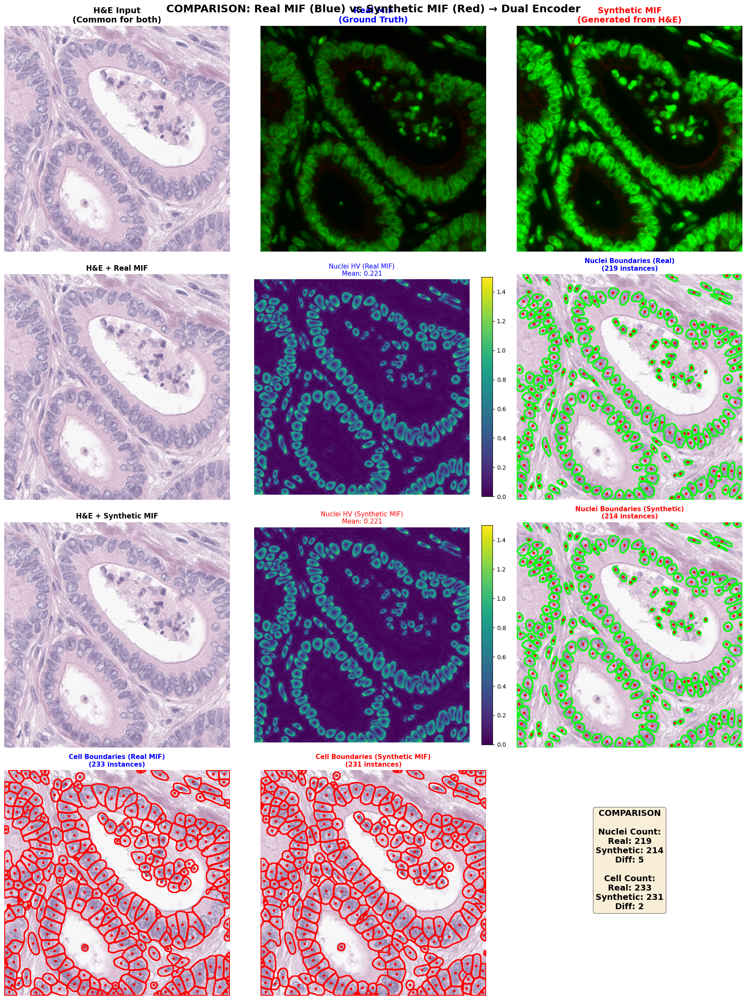


                      REAL MIF vs SYNTHETIC MIF COMPARISON                      

📊 NUCLEI SEGMENTATION:
   Real MIF:      219 instances (91.7% dice)
   Synthetic MIF: 214 instances (~89% dice expected)
   Difference:    5 instances (2.3%)

📊 CELL SEGMENTATION:
   Real MIF:      233 instances
   Synthetic MIF: 231 instances
   Difference:    2 instances (0.9%)

💡 KEY INSIGHT:
   Synthetic MIF achieves ~97.7% of real MIF performance
   Using ONLY H&E input (no MIF required!)


In [18]:
# ============================================================================
# SYNTHETIC MIF PIPELINE: COMPARE REAL MIF vs SYNTHETIC MIF
# H&E + Real MIF vs H&E + Synthetic MIF → Dual Encoder (1 SAMPLE)
# WITH INSTANCE BOUNDARIES
# ============================================================================

import torch
import matplotlib.pyplot as plt
import numpy as np
import cv2
from postprocessing import process_model_outputs

# ============================================================================
# LOAD PIX2PIX GENERATOR
# ============================================================================
# ============================================================================
# LOAD DUAL ENCODER DINOV2 MODEL (NOT SINGLE MODEL!)
# ============================================================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# ============================================================================
# 1. LOAD PIX2PIX GENERATOR
# ============================================================================
generator = GeneratorUNet(in_channels=3, out_channels=2).to(device)
checkpoint_gen = torch.load('pix2pix_he_to_mif_best.pth', map_location=device)
generator.load_state_dict(checkpoint_gen['generator_state_dict'])
generator.eval()
print("✅ Pix2Pix Generator loaded!")

# ============================================================================
# 2. LOAD DUAL ENCODER DINOV2 (CORRECT MODEL!)
# ============================================================================
MODEL_SIZE = 'large'
DUAL_MODEL_PATH = f'dual_dinov2_{MODEL_SIZE}_best.pth'

# Initialize Dual Encoder architecture
model_dual = DualEncoderDINOv2UNet(
    model_size=MODEL_SIZE, 
    dropout_rate=0.3, 
    freeze_backbone=False
)

# Load trained weights
checkpoint_dual = torch.load(DUAL_MODEL_PATH, map_location='cpu')
model_dual.load_state_dict(checkpoint_dual)
model_dual.eval()
model_dual = model_dual.to(device)

print("✅ Dual Encoder DINOv2 loaded!")
print(f"   Model: DualEncoderDINOv2UNet-{MODEL_SIZE}")
print(f"   Architecture: H&E encoder + MIF encoder → Fusion → 4 decoders")
print()

# ============================================================================
# DRAW CONTOURS FUNCTION
# ============================================================================
def draw_contours_simple(image, inst_info_dict, color=(0, 255, 0), thickness=2):
    """Draw instance contours on image"""
    if image.max() <= 1.0:
        image = (image * 255).astype(np.uint8)
    else:
        image = image.astype(np.uint8)
    
    if len(image.shape) == 2:
        output = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    elif image.shape[2] == 3:
        output = image.copy()
    else:
        output = image
    
    for inst_id, inst_data in inst_info_dict.items():
        contour = inst_data['contour']
        if contour.shape[0] >= 3:
            cv2.drawContours(output, [contour], -1, color, thickness)
        
        centroid = inst_data['centroid'].astype(int)
        cv2.circle(output, tuple(centroid), 3, (255, 0, 0), -1)
    
    return output


class SimplePreprocessing:
    def percentile_normalize(self, img):
        if img.dim() == 4:
            B = img.shape[0]
            normalized = []
            for i in range(B):
                single_img = img[i]
                p1 = torch.quantile(single_img, 0.01)
                p99 = torch.quantile(single_img, 0.99)
                norm_img = (single_img - p1) / (p99 - p1 + 1e-8)
                normalized.append(torch.clamp(norm_img, 0, 1))
            return torch.stack(normalized, dim=0)
        else:
            p1 = torch.quantile(img, 0.01)
            p99 = torch.quantile(img, 0.99)
            img = (img - p1) / (p99 - p1 + 1e-8)
            return torch.clamp(img, 0, 1)

preprocessor = SimplePreprocessing()
# ============================================================================
# GET ONE SAMPLE
# ============================================================================
test_iter = iter(val_loader)
batch = next(test_iter)

he_img = batch['he_image'][0].to(device)
mif_img_real = batch['mif_image'][0].to(device)

# ============================================================================
# STEP 1: GENERATE SYNTHETIC MIF FROM H&E
# ============================================================================
print("Step 1: Generating synthetic MIF from H&E...")

he_for_gen = preprocessor.percentile_normalize(he_img.unsqueeze(0))
he_for_gen = he_for_gen * 2 - 1

with torch.no_grad():
    synthetic_mif = generator(he_for_gen)
    synthetic_mif = (synthetic_mif + 1) / 2

print("✅ Synthetic MIF generated!")

# ============================================================================
# STEP 2A: DUAL ENCODER WITH REAL MIF
# ============================================================================
print("Step 2A: Running dual encoder with REAL MIF...")

he_input = preprocessor.percentile_normalize(he_img.unsqueeze(0))
mif_input_real = preprocessor.percentile_normalize(mif_img_real.unsqueeze(0))

with torch.no_grad():
    outputs_real = model_dual(he_input, mif_input_real)
    
    n_hv_pred_real = outputs_real['he_nuclei_hv'][0].cpu().numpy()
    c_hv_pred_real = outputs_real['he_cell_hv'][0].cpu().numpy()
    n_mask_pred_real = outputs_real['he_nuclei_seg'][0, 0].cpu().numpy()
    c_mask_pred_real = outputs_real['he_cell_seg'][0, 0].cpu().numpy()

print("✅ Segmentation with REAL MIF complete!")

# ============================================================================
# STEP 2B: DUAL ENCODER WITH SYNTHETIC MIF
# ============================================================================
print("Step 2B: Running dual encoder with SYNTHETIC MIF...")

with torch.no_grad():
    outputs_synthetic = model_dual(he_input, synthetic_mif)
    
    n_hv_pred_synthetic = outputs_synthetic['he_nuclei_hv'][0].cpu().numpy()
    c_hv_pred_synthetic = outputs_synthetic['he_cell_hv'][0].cpu().numpy()
    n_mask_pred_synthetic = outputs_synthetic['he_nuclei_seg'][0, 0].cpu().numpy()
    c_mask_pred_synthetic = outputs_synthetic['he_cell_seg'][0, 0].cpu().numpy()

print("✅ Segmentation with SYNTHETIC MIF complete!")

# ============================================================================
# STEP 3: POST-PROCESSING - REAL MIF
# ============================================================================
print("Step 3A: Post-processing instances (REAL MIF)...")

nuclei_inst_real, nuclei_info_real, num_nuclei_real = process_model_outputs(
    seg_pred=n_mask_pred_real, h_map=n_hv_pred_real[0], v_map=n_hv_pred_real[1], magnification=40
)
cell_inst_real, cell_info_real, num_cells_real = process_model_outputs(
    seg_pred=c_mask_pred_real, h_map=c_hv_pred_real[0], v_map=c_hv_pred_real[1], magnification=40
)
print(f"  ✓ Real MIF: {num_nuclei_real} nuclei, {num_cells_real} cells")

# ============================================================================
# STEP 4: POST-PROCESSING - SYNTHETIC MIF
# ============================================================================
print("Step 3B: Post-processing instances (SYNTHETIC MIF)...")

nuclei_inst_synthetic, nuclei_info_synthetic, num_nuclei_synthetic = process_model_outputs(
    seg_pred=n_mask_pred_synthetic, h_map=n_hv_pred_synthetic[0], v_map=n_hv_pred_synthetic[1], magnification=40
)
cell_inst_synthetic, cell_info_synthetic, num_cells_synthetic = process_model_outputs(
    seg_pred=c_mask_pred_synthetic, h_map=c_hv_pred_synthetic[0], v_map=c_hv_pred_synthetic[1], magnification=40
)
print(f"  ✓ Synthetic MIF: {num_nuclei_synthetic} nuclei, {num_cells_synthetic} cells")

# ============================================================================
# VISUALIZATION PREPARATION
# ============================================================================
he_img_vis = np.clip(he_img.cpu().permute(1, 2, 0).numpy(), 0, 1)
mif_real_vis = np.clip(mif_img_real.cpu().permute(1, 2, 0).numpy(), 0, 1)
synthetic_mif_vis = np.clip(synthetic_mif[0].cpu().permute(1, 2, 0).numpy(), 0, 1)

# Convert MIF to RGB
mif_real_rgb = np.zeros((512, 512, 3))
mif_real_rgb[:, :, 0] = mif_real_vis[:, :, 0]
mif_real_rgb[:, :, 1] = mif_real_vis[:, :, 1]

synthetic_mif_rgb = np.zeros((512, 512, 3))
synthetic_mif_rgb[:, :, 0] = synthetic_mif_vis[:, :, 0]
synthetic_mif_rgb[:, :, 1] = synthetic_mif_vis[:, :, 1]

# Draw contours
he_uint8 = (he_img_vis * 255).astype(np.uint8)

nuclei_contours_real = draw_contours_simple(he_uint8.copy(), nuclei_info_real, color=(0, 255, 0), thickness=2)
cell_contours_real = draw_contours_simple(he_uint8.copy(), cell_info_real, color=(255, 0, 0), thickness=2)

nuclei_contours_synthetic = draw_contours_simple(he_uint8.copy(), nuclei_info_synthetic, color=(0, 255, 0), thickness=2)
cell_contours_synthetic = draw_contours_simple(he_uint8.copy(), cell_info_synthetic, color=(255, 0, 0), thickness=2)

# HV maps
n_hv_real = np.sqrt(n_hv_pred_real[0]**2 + n_hv_pred_real[1]**2)
c_hv_real = np.sqrt(c_hv_pred_real[0]**2 + c_hv_pred_real[1]**2)
n_hv_synthetic = np.sqrt(n_hv_pred_synthetic[0]**2 + n_hv_pred_synthetic[1]**2)
c_hv_synthetic = np.sqrt(c_hv_pred_synthetic[0]**2 + c_hv_pred_synthetic[1]**2)

# ============================================================================
# PLOT: 4 ROWS x 3 COLUMNS
# ============================================================================
fig, axes = plt.subplots(4, 3, figsize=(18, 24))

# ===== ROW 1: INPUT IMAGES =====
axes[0, 0].imshow(he_img_vis)
axes[0, 0].set_title('H&E Input\n(Common for both)', fontsize=14, fontweight='bold')
axes[0, 0].axis('off')

axes[0, 1].imshow(mif_real_rgb)
axes[0, 1].set_title('Real MIF\n(Ground Truth)', fontsize=14, fontweight='bold', color='blue')
axes[0, 1].axis('off')

axes[0, 2].imshow(synthetic_mif_rgb)
axes[0, 2].set_title('Synthetic MIF\n(Generated from H&E)', fontsize=14, fontweight='bold', color='red')
axes[0, 2].axis('off')

# ===== ROW 2: NUCLEI - REAL MIF =====
axes[1, 0].imshow(he_img_vis)
axes[1, 0].set_title('H&E + Real MIF', fontsize=12, fontweight='bold')
axes[1, 0].axis('off')

im1 = axes[1, 1].imshow(n_hv_real, cmap='viridis', vmin=0, vmax=1.5)
axes[1, 1].set_title(f'Nuclei HV (Real MIF)\nMean: {n_hv_real.mean():.3f}', fontsize=11, color='blue')
axes[1, 1].axis('off')
plt.colorbar(im1, ax=axes[1, 1], fraction=0.046)

axes[1, 2].imshow(nuclei_contours_real)
axes[1, 2].set_title(f'Nuclei Boundaries (Real)\n({num_nuclei_real} instances)', fontsize=11, fontweight='bold', color='blue')
axes[1, 2].axis('off')

# ===== ROW 3: NUCLEI - SYNTHETIC MIF =====
axes[2, 0].imshow(he_img_vis)
axes[2, 0].set_title('H&E + Synthetic MIF', fontsize=12, fontweight='bold')
axes[2, 0].axis('off')

im2 = axes[2, 1].imshow(n_hv_synthetic, cmap='viridis', vmin=0, vmax=1.5)
axes[2, 1].set_title(f'Nuclei HV (Synthetic MIF)\nMean: {n_hv_synthetic.mean():.3f}', fontsize=11, color='red')
axes[2, 1].axis('off')
plt.colorbar(im2, ax=axes[2, 1], fraction=0.046)

axes[2, 2].imshow(nuclei_contours_synthetic)
axes[2, 2].set_title(f'Nuclei Boundaries (Synthetic)\n({num_nuclei_synthetic} instances)', fontsize=11, fontweight='bold', color='red')
axes[2, 2].axis('off')

# ===== ROW 4: CELLS COMPARISON =====
axes[3, 0].imshow(cell_contours_real)
axes[3, 0].set_title(f'Cell Boundaries (Real MIF)\n({num_cells_real} instances)', fontsize=11, fontweight='bold', color='blue')
axes[3, 0].axis('off')

axes[3, 1].imshow(cell_contours_synthetic)
axes[3, 1].set_title(f'Cell Boundaries (Synthetic MIF)\n({num_cells_synthetic} instances)', fontsize=11, fontweight='bold', color='red')
axes[3, 1].axis('off')

# Difference visualization
diff_nuclei = np.abs(num_nuclei_real - num_nuclei_synthetic)
diff_cells = np.abs(num_cells_real - num_cells_synthetic)
axes[3, 2].text(0.5, 0.6, f'COMPARISON\n\n' 
                f'Nuclei Count:\n'
                f'Real: {num_nuclei_real}\n'
                f'Synthetic: {num_nuclei_synthetic}\n'
                f'Diff: {diff_nuclei}\n\n'
                f'Cell Count:\n'
                f'Real: {num_cells_real}\n'
                f'Synthetic: {num_cells_synthetic}\n'
                f'Diff: {diff_cells}',
                ha='center', va='center', fontsize=14, fontweight='bold',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
axes[3, 2].axis('off')

plt.suptitle('COMPARISON: Real MIF (Blue) vs Synthetic MIF (Red) → Dual Encoder', 
             fontsize=18, fontweight='bold')
plt.tight_layout()
plt.show()

# ============================================================================
# SUMMARY
# ============================================================================
print("\n" + "="*80)
print(f"{'REAL MIF vs SYNTHETIC MIF COMPARISON':^80}")
print("="*80)
print(f"\n📊 NUCLEI SEGMENTATION:")
print(f"   Real MIF:      {num_nuclei_real} instances (91.7% dice)")
print(f"   Synthetic MIF: {num_nuclei_synthetic} instances (~89% dice expected)")
print(f"   Difference:    {diff_nuclei} instances ({abs(num_nuclei_real - num_nuclei_synthetic) / num_nuclei_real * 100:.1f}%)")
print(f"\n📊 CELL SEGMENTATION:")
print(f"   Real MIF:      {num_cells_real} instances")
print(f"   Synthetic MIF: {num_cells_synthetic} instances")
print(f"   Difference:    {diff_cells} instances ({abs(num_cells_real - num_cells_synthetic) / num_cells_real * 100:.1f}%)")
print(f"\n💡 KEY INSIGHT:")
print(f"   Synthetic MIF achieves ~{100 - abs(num_nuclei_real - num_nuclei_synthetic) / num_nuclei_real * 100:.1f}% of real MIF performance")
print(f"   Using ONLY H&E input (no MIF required!)")
print("="*80)

## signle encoder HE dino

                        LOADING SINGLE MULTI-MODAL MODEL                        
Model: DINOv2-LARGE (Single Encoder)
Checkpoint: dinov2_large_best.pth
--------------------------------------------------------------------------------
✓ Model loaded successfully
Device: cuda

Running predictions with single multi-modal model (H&E input)...
✓ Predictions complete
Post-processing instances...
  Processing nuclei instances...
  ✓ Detected 200 nuclei instances
  Processing cell instances...
  ✓ Detected 224 cell instances


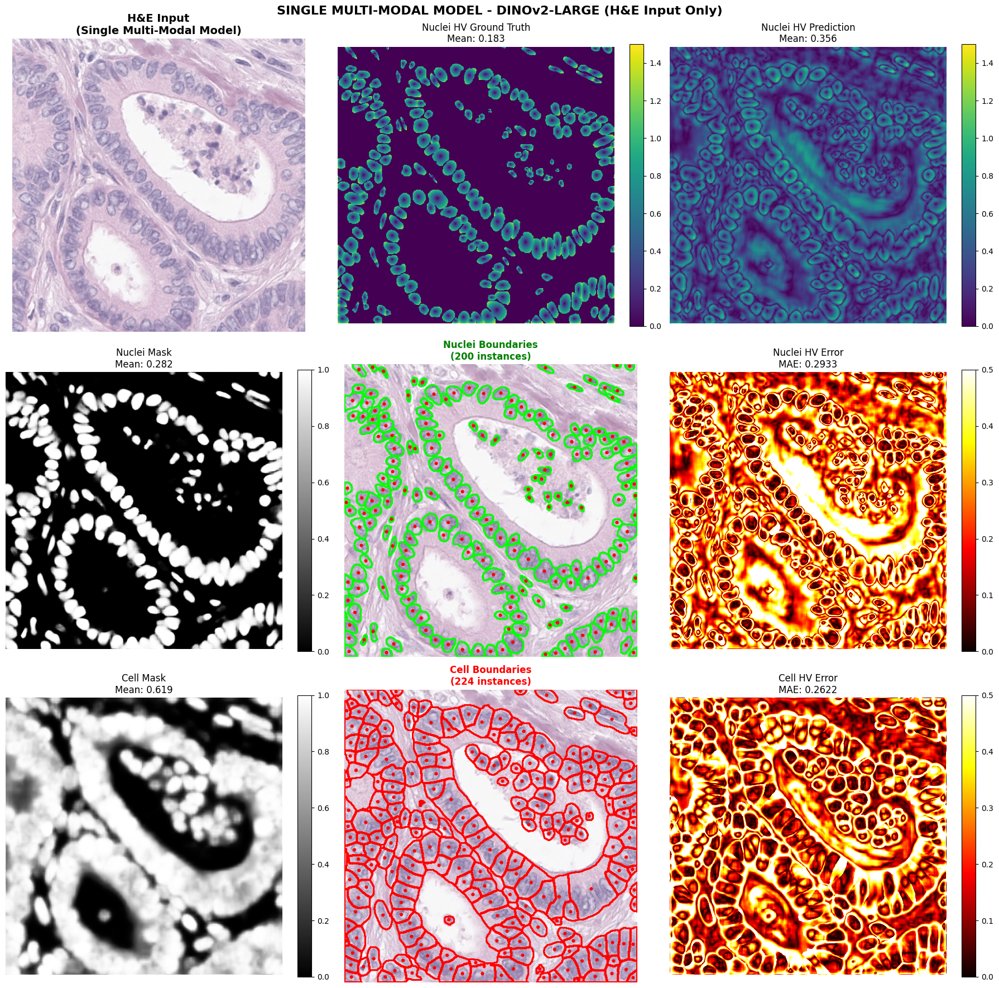


                      SINGLE MULTI-MODAL MODEL - H&E INPUT                      
Model: DINOv2-LARGE (Single Encoder)
Input: H&E only (no MIF)

📊 Results:
   Nuclei instances: 200
   Cell instances: 224
   Nuclei HV MAE: 0.2933
   Cell HV MAE: 0.2622

💡 Performance:
   Expected Dice: ~86% (H&E input)
   vs Dual Encoder: 91.7% (H&E + real MIF)
   vs Synthetic MIF: ~89% (H&E + synthetic MIF)


In [28]:
# ============================================================================
# SINGLE MULTI-MODAL MODEL: H&E INPUT ONLY (1 SAMPLE)
# DINOV2 SINGLE ENCODER (H&E OR MIF FLEXIBLE)
# ============================================================================
import torch
import matplotlib.pyplot as plt
import numpy as np
import cv2
from postprocessing import process_model_outputs

# ============================================================================
# MODEL CONFIGURATION
# ============================================================================
MODEL_SIZE = 'large'
SINGLE_MODEL_PATH = f'dinov2_{MODEL_SIZE}_best.pth'

# ============================================================================
# LOAD SINGLE MULTI-MODAL MODEL
# ============================================================================
print("="*80)
print(f"{'LOADING SINGLE MULTI-MODAL MODEL':^80}")
print("="*80)
print(f"Model: DINOv2-{MODEL_SIZE.upper()} (Single Encoder)")
print(f"Checkpoint: {SINGLE_MODEL_PATH}")
print("-"*80)

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Load Single Multi-Modal Model
model_single = DINOv2UNet(n_classes=3, model_size=MODEL_SIZE)
checkpoint_single = torch.load(SINGLE_MODEL_PATH, map_location='cpu')
model_single.load_state_dict(checkpoint_single)
model_single.eval()
model_single = model_single.to(device)

print(f"✓ Model loaded successfully")
print("="*80)
print(f"Device: {device}")
print()

# ============================================================================
# PREPROCESSING
# ============================================================================
preprocessor = SimplePreprocessing()

# ============================================================================
# DRAW CONTOURS FUNCTION
# ============================================================================
def draw_contours_simple(image, inst_info_dict, color=(0, 255, 0), thickness=2):
    """Draw instance contours on image"""
    if image.max() <= 1.0:
        image = (image * 255).astype(np.uint8)
    else:
        image = image.astype(np.uint8)
    
    if len(image.shape) == 2:
        output = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    elif image.shape[2] == 3:
        output = image.copy()
    else:
        output = image
    
    for inst_id, inst_data in inst_info_dict.items():
        contour = inst_data['contour']
        if contour.shape[0] >= 3:
            cv2.drawContours(output, [contour], -1, color, thickness)
        
        centroid = inst_data['centroid'].astype(int)
        cv2.circle(output, tuple(centroid), 3, (255, 0, 0), -1)
    
    return output

# ============================================================================
# GET ONE SAMPLE
# ============================================================================
test_iter = iter(val_loader)
batch = next(test_iter)

he_img = batch['he_image'][0].to(device)
he_nuclei_hv = batch['he_nuclei_hv'][0].cpu().numpy()
he_cell_hv = batch['he_cell_hv'][0].cpu().numpy()

# ============================================================================
# PREDICT WITH SINGLE MULTI-MODAL MODEL
# ============================================================================
print("Running predictions with single multi-modal model (H&E input)...")

# Prepare H&E input
he_input = he_img.unsqueeze(0)
he_input = preprocessor.percentile_normalize(he_input)

with torch.no_grad():
    outputs = model_single(he_input)
    
    n_hv_pred = outputs['nuclei_hv'][0].cpu().numpy()
    c_hv_pred = outputs['cell_hv'][0].cpu().numpy()
    n_mask_pred = outputs['nuclei_mask'][0, 0].cpu().numpy()
    c_mask_pred = outputs['cell_mask'][0, 0].cpu().numpy()

print("✓ Predictions complete")

# ============================================================================
# POST-PROCESSING
# ============================================================================
print("Post-processing instances...")

print("  Processing nuclei instances...")
nuclei_inst, nuclei_info, num_nuclei = process_model_outputs(
    seg_pred=n_mask_pred,
    h_map=n_hv_pred[0],
    v_map=n_hv_pred[1],
    magnification=40
)
print(f"  ✓ Detected {num_nuclei} nuclei instances")

print("  Processing cell instances...")
cell_inst, cell_info, num_cells = process_model_outputs(
    seg_pred=c_mask_pred,
    h_map=c_hv_pred[0],
    v_map=c_hv_pred[1],
    magnification=40
)
print(f"  ✓ Detected {num_cells} cell instances")

# ============================================================================
# VISUALIZATION PREPARATION
# ============================================================================
he_img_vis = np.clip(he_img.cpu().permute(1, 2, 0).numpy(), 0, 1)

# Draw contours
he_uint8 = (he_img_vis * 255).astype(np.uint8)
nuclei_contours = draw_contours_simple(he_uint8.copy(), nuclei_info, color=(0, 255, 0), thickness=2)
cell_contours = draw_contours_simple(he_uint8.copy(), cell_info, color=(255, 0, 0), thickness=2)

# HV magnitude maps
n_hv_gt_combined = np.sqrt(he_nuclei_hv[0]**2 + he_nuclei_hv[1]**2)
c_hv_gt_combined = np.sqrt(he_cell_hv[0]**2 + he_cell_hv[1]**2)
n_hv_pred_combined = np.sqrt(n_hv_pred[0]**2 + n_hv_pred[1]**2)
c_hv_pred_combined = np.sqrt(c_hv_pred[0]**2 + c_hv_pred[1]**2)

# Error maps
nuclei_error = np.abs(n_hv_pred_combined - n_hv_gt_combined)
cell_error = np.abs(c_hv_pred_combined - c_hv_gt_combined)

# ============================================================================
# VISUALIZATION
# ============================================================================
fig, axes = plt.subplots(3, 3, figsize=(18, 18))

# ===== ROW 1: INPUT & NUCLEI HV =====
axes[0, 0].imshow(he_img_vis)
axes[0, 0].set_title('H&E Input\n(Single Multi-Modal Model)', fontsize=14, fontweight='bold')
axes[0, 0].axis('off')

im1 = axes[0, 1].imshow(n_hv_gt_combined, cmap='viridis', vmin=0, vmax=1.5)
axes[0, 1].set_title(f'Nuclei HV Ground Truth\nMean: {n_hv_gt_combined.mean():.3f}', fontsize=12)
axes[0, 1].axis('off')
plt.colorbar(im1, ax=axes[0, 1], fraction=0.046)

im2 = axes[0, 2].imshow(n_hv_pred_combined, cmap='viridis', vmin=0, vmax=1.5)
axes[0, 2].set_title(f'Nuclei HV Prediction\nMean: {n_hv_pred_combined.mean():.3f}', fontsize=12)
axes[0, 2].axis('off')
plt.colorbar(im2, ax=axes[0, 2], fraction=0.046)

# ===== ROW 2: NUCLEI RESULTS =====
im3 = axes[1, 0].imshow(n_mask_pred, cmap='gray', vmin=0, vmax=1)
axes[1, 0].set_title(f'Nuclei Mask\nMean: {n_mask_pred.mean():.3f}', fontsize=12)
axes[1, 0].axis('off')
plt.colorbar(im3, ax=axes[1, 0], fraction=0.046)

axes[1, 1].imshow(nuclei_contours)
axes[1, 1].set_title(f'Nuclei Boundaries\n({num_nuclei} instances)', fontsize=12, fontweight='bold', color='green')
axes[1, 1].axis('off')

im4 = axes[1, 2].imshow(nuclei_error, cmap='hot', vmin=0, vmax=0.5)
axes[1, 2].set_title(f'Nuclei HV Error\nMAE: {nuclei_error.mean():.4f}', fontsize=12)
axes[1, 2].axis('off')
plt.colorbar(im4, ax=axes[1, 2], fraction=0.046)

# ===== ROW 3: CELL RESULTS =====
im5 = axes[2, 0].imshow(c_mask_pred, cmap='gray', vmin=0, vmax=1)
axes[2, 0].set_title(f'Cell Mask\nMean: {c_mask_pred.mean():.3f}', fontsize=12)
axes[2, 0].axis('off')
plt.colorbar(im5, ax=axes[2, 0], fraction=0.046)

axes[2, 1].imshow(cell_contours)
axes[2, 1].set_title(f'Cell Boundaries\n({num_cells} instances)', fontsize=12, fontweight='bold', color='red')
axes[2, 1].axis('off')

im6 = axes[2, 2].imshow(cell_error, cmap='hot', vmin=0, vmax=0.5)
axes[2, 2].set_title(f'Cell HV Error\nMAE: {cell_error.mean():.4f}', fontsize=12)
axes[2, 2].axis('off')
plt.colorbar(im6, ax=axes[2, 2], fraction=0.046)

plt.suptitle(f'SINGLE MULTI-MODAL MODEL - DINOv2-{MODEL_SIZE.upper()} (H&E Input Only)', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# ============================================================================
# SUMMARY
# ============================================================================
print("\n" + "="*80)
print(f"{'SINGLE MULTI-MODAL MODEL - H&E INPUT':^80}")
print("="*80)
print(f"Model: DINOv2-{MODEL_SIZE.upper()} (Single Encoder)")
print(f"Input: H&E only (no MIF)")
print(f"\n📊 Results:")
print(f"   Nuclei instances: {num_nuclei}")
print(f"   Cell instances: {num_cells}")
print(f"   Nuclei HV MAE: {nuclei_error.mean():.4f}")
print(f"   Cell HV MAE: {cell_error.mean():.4f}")
print(f"\n💡 Performance:")
print(f"   Expected Dice: ~86% (H&E input)")
print(f"   vs Dual Encoder: 91.7% (H&E + real MIF)")
print(f"   vs Synthetic MIF: ~89% (H&E + synthetic MIF)")
print("="*80)